In [1]:
%matplotlib inline

import matplotlib
from matplotlib import pyplot
import numpy
import pandas
import plotly.express as px
from scipy import stats
import seaborn
import sys

pandas.options.display.max_columns = None
pandas.options.display.max_rows = None

matplotlib.rcParams['figure.dpi'] = 200
matplotlib.rcParams['agg.path.chunksize'] = 10000
print(f'Package versions:\nPython {sys.version}, matplotlib {matplotlib.__version__}, '
      f'numpy {numpy.__version__}, pandas {pandas.__version__}, '
      f'plotly {sys.modules["plotly"].__version__}, '
      f'scipy {sys.modules["scipy"].__version__}, seaborn {seaborn.__version__}')

Package versions:
Python 3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:53) 
[GCC 9.4.0], matplotlib 3.4.2, numpy 1.21.0, pandas 1.1.5, plotly 5.16.1, scipy 1.7.0, seaborn 0.11.1


In [2]:
drop_dups = pandas.read_csv('./read_dataframe.csv')
print(drop_dups.shape)
drop_dups.head()

(122107296, 12)


,well_id,r1,r2,seq_corr,edit_type,umi,bc_tracer,het_spacer_offset,bc1_corr,bc2_corr,condition,read_count
0,A1,TGCACCGAACGCAACGCACGCACCTTGTTTCTTCATTGGTACACAC...,GGGTGGGGTGGGCTTGGATGTCTTTTGGTGCCAGCCATCCACTAGA...,CACCGAACGCAACGCACGCA,tracer,GTCTTTTGGT,CCTTGTTTCTTCAT+ACACACGTCAGTACCATGGTACGTACGTCA,2,UNKNOWN,UNKNOWN,UNKNOWN,1
1,A1,TTAGTAGCCATTCTCATCCAAACCCCCTGAAGCTTCACCGGCGCAG...,GTACGGTCAAAAATTAAGAGGATGAATCAGTCTCTATATCCTAGTA...,GCCATTCTCATCCAAACCCCCTGAAGCTTCACCGGCGCAGTCATTC,WT,GGATGAATCA,UNKNOWN,6,ATCCTGTA,GTCTCTAT,lhon_d5,1
2,A1,TGCACCGAACGCAACGCACGCACCATCCAGATGGCATGGTTGCACA...,CACAACAGTACTATAAACAGGTTTAACTGCGTAATACAAACAACAT...,CACCGAACGCAACGCACGCA,tracer,GGTTTAACTG,CCATCCAGATGGCA+TGCACATGACACACGTCATGACACACCATG,2,AAACATCG,CGTAATAC,lhon_d0,1
3,A1,TGGTGCACCGAACGCAACGCACGCAATCCCCAAAGAGGATGGTTGT...,AACAAGTGTGCACATACAACTCGGGGGTTTGCGGCGCAAACACTAG...,CACCGAACGCAACGCACGCA,tracer,CTCGGGGGTT,ATCCCCAAAGAGGA+TGTGGTCATGTGACACTGCAGTACTGACTG,5,CATCAAGT,TGCGGCGC,lhon_d0,1
4,A1,ACGTGCACCGAACGCAACGCACGCAACACGCAGGAAACTTGGTTGT...,CACACAAGTCCACTTCCGACTAGGACTCATATTATAACAACACCAG...,CACCGAACGCAACGCACGCA,tracer,CTAGGACTCA,ACACGCAGGAAACT+TGTGCAACACGTTGACTGCAACTGACGTCA,5,AACAACCA,TATTATAA,silent_d0,1


## Make barplot

### Make plots for the read 1 matches

In [3]:
all_stats = drop_dups.groupby('edit_type')['read_count'].sum()
all_stats['TOTAL'] = all_stats.sum()
all_stats = all_stats.rename('read_count').reset_index().sort_values(by='read_count', ascending=False)
all_stats

,edit_type,read_count
11,TOTAL,122107461
10,tracer,77723298
9,WT,29160551
5,SILENT,8147535
1,LHON_BY1,3468689
8,UNKNOWN,2906698
6,SILENT_BY1,170779
0,LHON,136887
7,SILENT_BY2,103061
4,LHON_BY4,101282


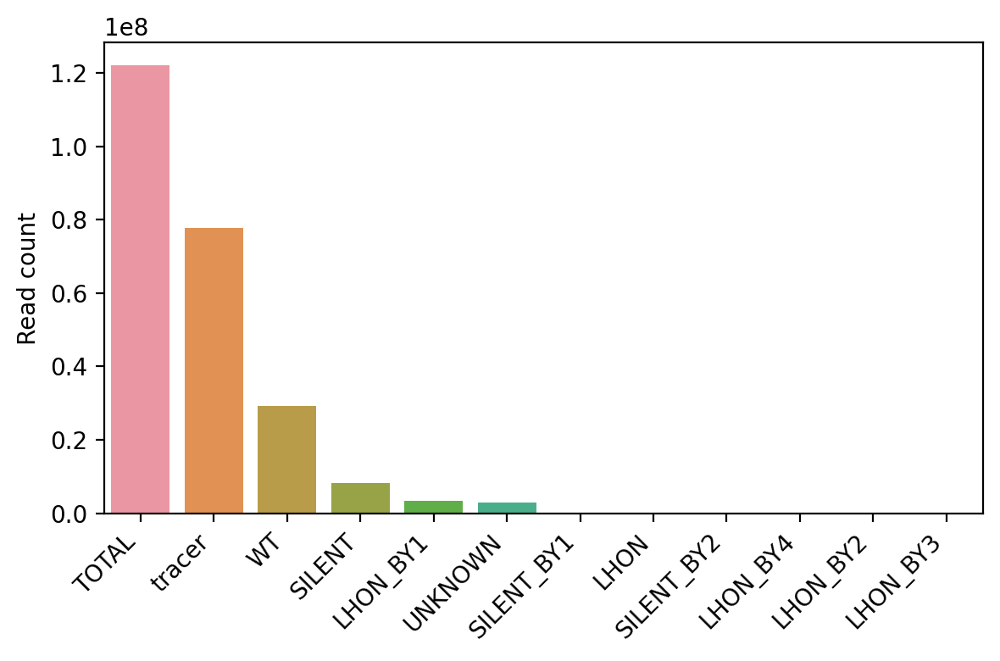

In [4]:
#plot read 1 matches
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.barplot(data=all_stats, x='edit_type', y='read_count', ax=axes)
axes.set_xticklabels(axes.get_xticklabels(), rotation=45, ha='right', fontsize=10)
axes.set_xlabel('')
axes.set_ylabel('Read count')
fig.tight_layout()

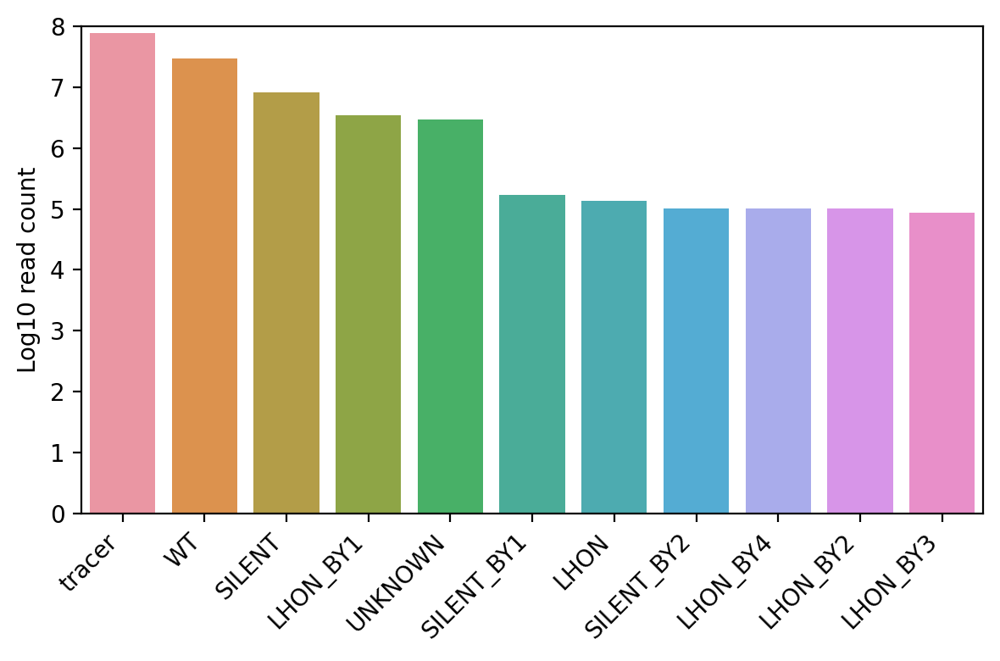

In [5]:
#plot read 1 matches
all_stats['log_read_count'] = numpy.log10(all_stats['read_count'])

fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.barplot(data=all_stats[all_stats['edit_type'] != 'TOTAL'], x='edit_type', y='log_read_count', ax=axes)
axes.set_xticklabels(axes.get_xticklabels(), rotation=45, ha='right', fontsize=10)
axes.set_ylim(0,8)
axes.set_xlabel('')
axes.set_ylabel('Log10 read count')
fig.tight_layout()

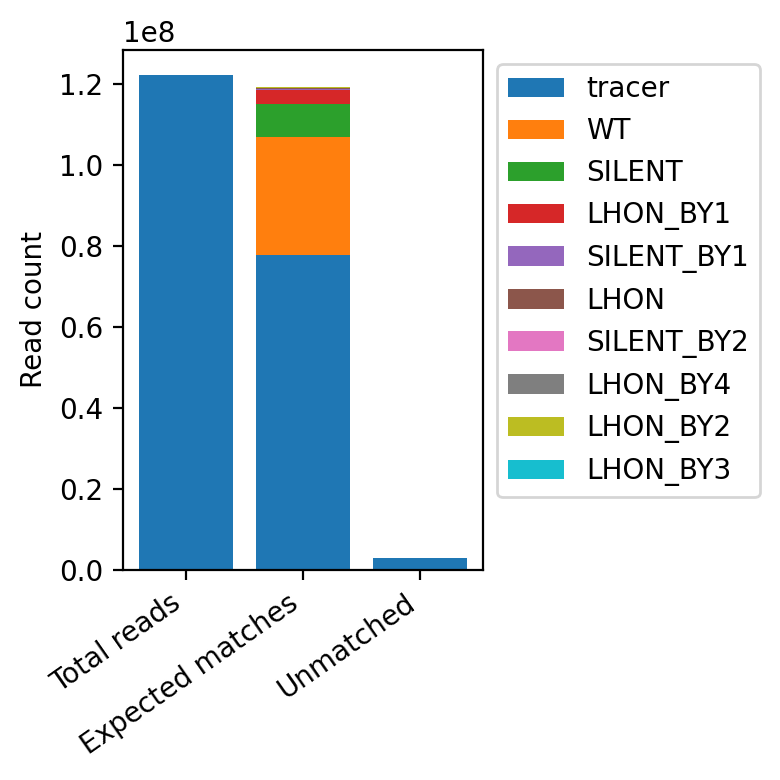

In [6]:
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,4))
axes.bar(x=0, height=all_stats.loc[all_stats['edit_type'] == 'TOTAL', 'read_count'], color='C0')

stacked_indices = ~all_stats['edit_type'].isin(['UNKNOWN', 'TOTAL'])
bottom=0
for r1_name, val in all_stats.loc[stacked_indices, ['edit_type', 'read_count']].to_numpy():
    axes.bar(x=1, height=val, bottom=bottom, label=r1_name)
    bottom += val

axes.bar(x=2, height=all_stats.loc[all_stats['edit_type'] == 'UNKNOWN', 'read_count'], color='C0')

axes.set_xticks(numpy.arange(3))
axes.set_xticklabels(['Total reads', 'Expected matches', 'Unmatched'], ha='right', rotation=35)
axes.set_ylabel('Read count')
axes.legend(bbox_to_anchor=[1,1])
fig.tight_layout()

### Make plots for the read2 matches

In [7]:
all_stats = drop_dups.groupby('condition')['read_count'].sum()
all_stats['TOTAL'] = all_stats.sum()
order = ['TOTAL', 'UNKNOWN'] + sorted(all_stats.loc[~all_stats.index.isin(['TOTAL', 'UNKNOWN'])].index.values)
all_stats = all_stats.loc[order].rename('read_count').reset_index()
all_stats

,condition,read_count
0,TOTAL,122107461
1,UNKNOWN,25969102
2,lhon_d0,31944144
3,lhon_d5,24487573
4,silent_d0,26825278
5,silent_d5,12881364


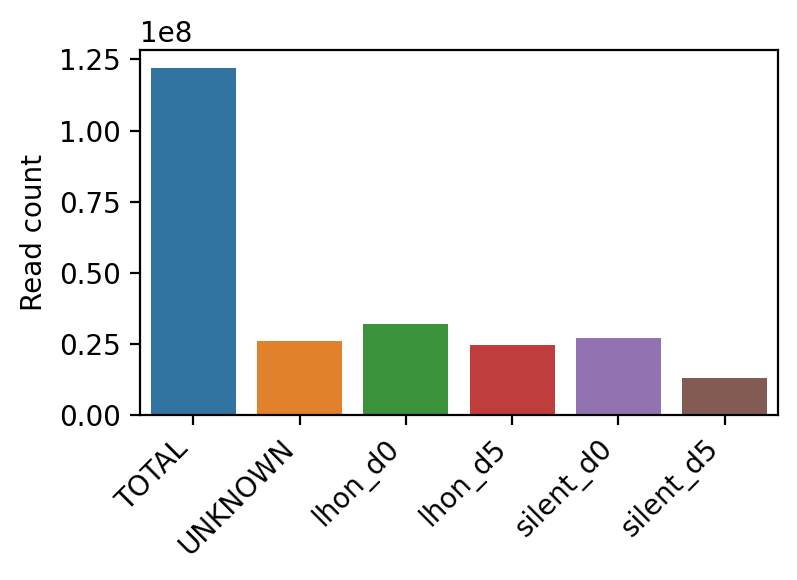

In [8]:
#plot read 2 matches
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,3))
seaborn.barplot(data=all_stats, x='condition', y='read_count', ax=axes)
axes.set_xticklabels(axes.get_xticklabels(), rotation=45, ha='right', fontsize=10)
axes.set_xlabel('')
axes.set_ylabel('Read count')
fig.tight_layout()

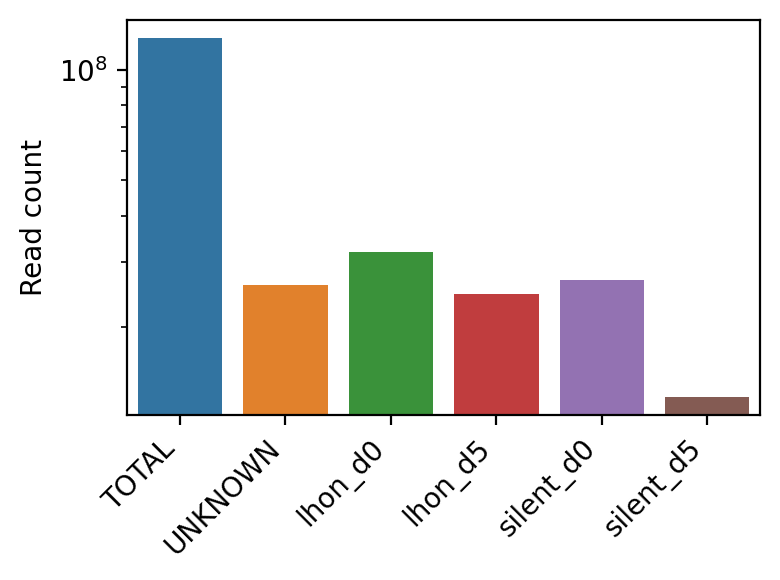

In [9]:
#plot read 2 matches
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,3))
seaborn.barplot(data=all_stats, x='condition', y='read_count', ax=axes)
axes.set_yscale('log')
axes.set_xticklabels(axes.get_xticklabels(), rotation=45, ha='right', fontsize=10)
axes.set_xlabel('')
axes.set_ylabel('Read count')
fig.tight_layout()

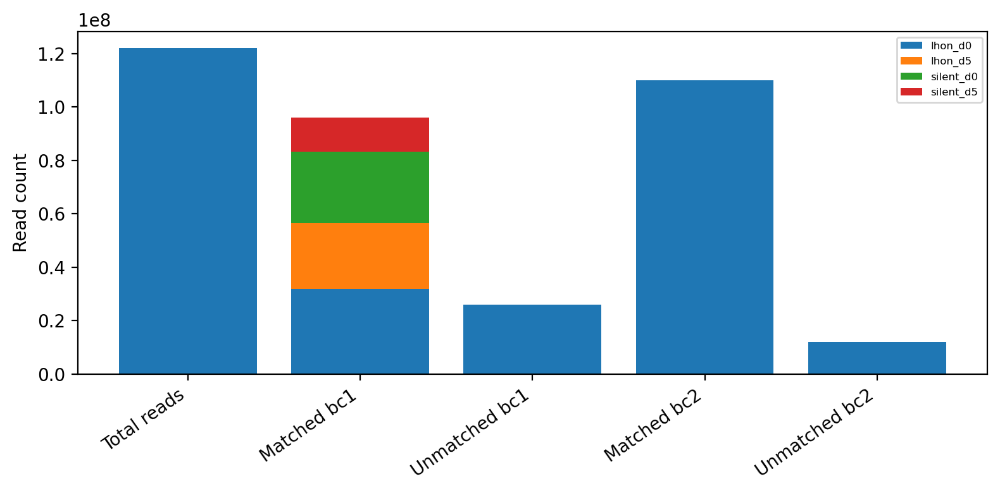

In [11]:
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(8,4))
axes.bar(x=0, height=all_stats.loc[all_stats['condition'] == 'TOTAL', 'read_count'], color='C0')

stacked_indices = ~all_stats['condition'].isin(['UNKNOWN', 'TOTAL'])
bottom=0
for r1_name, val in all_stats.loc[stacked_indices].to_numpy():
    axes.bar(x=1, height=val, bottom=bottom, label=r1_name)
    bottom += val

axes.bar(x=2, height=all_stats.loc[all_stats['condition'] == 'UNKNOWN', 'read_count'], color='C0')

axes.bar(x=3, height=drop_dups.loc[drop_dups['bc2_corr'] != 'UNKNOWN', 'read_count'].sum(), color='C0')
axes.bar(x=4, height=drop_dups.loc[drop_dups['bc2_corr'] == 'UNKNOWN', 'read_count'].sum(), color='C0')

axes.set_xticks(numpy.arange(5))
axes.set_xticklabels(['Total reads', 'Matched bc1', 'Unmatched bc1', 
                      'Matched bc2', 'Unmatched bc2'], ha='right', rotation=35)
axes.set_ylabel('Read count')
axes.legend(bbox_to_anchor=[1,1], fontsize=6)
fig.tight_layout()

In [12]:
valid_cells = pandas.read_csv('./heteroplasmy_dataframe.csv')
print(valid_cells.shape)
valid_cells.head()

(11941, 21)


,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,tracer,tracer_umi_count,tracer_type_count,top1_tracer_sequence,top2_tracer_sequence,top1_tracer_count,top2_tracer_count,umi_count_for_filtering,umi_count_rank,tracer_het,LHON_het,SILENT_het,SILENT_ONLY_het,total_het
0,A1-CATCAAGT-TGCGGCGC,lhon_d0,98,0,64,20,0,14,14.0,1.0,ATCCCCAAAGAGGA+TGTGGTCATGTGACACTGCAGTACTGACTG,NaN,14.0,NaN,84,1739,0.142857,0.761905,1.000000,0.238095,1.000000
1,A1-AACAACCA-TATTATAA,silent_d0,51,0,0,0,32,19,19.0,2.0,ACACGCAGGAAACT+TGTGCAACACGTTGACTGCAACTGACGTCA,GACATGCGGCTTGT+ACTGACACTGCAACCAGTCAGTTGGTACCA,18.0,1.0,32,9939,0.372549,0.000000,0.000000,0.000000,0.000000
2,A1-CGCTGATC-GTAGCTAA,lhon_d0,106,0,0,0,59,47,47.0,2.0,TTTAAGATTGTGGA+TGGTCAGTTGCATGGTACGTACACGTACAC,TTCGCGTAGCGGAG+CAGTACACCATGACTGACTGACCAGTCATG,46.0,1.0,59,3766,0.443396,0.000000,0.000000,0.000000,0.000000
3,A1-CTGAGCCA-TGCCAGCC,silent_d5,684,0,0,67,311,306,306.0,5.0,CCTTGTTTCTTCAT+ACACACGTCAGTACCATGGTACGTACGTCA,TAACGCGTCTGGAT+TGGTTGTGTGGTTGCACATGTGACGTTGTG,149.0,54.0,378,12,0.447368,0.000000,0.177249,0.177249,0.177249
4,A1-AAGACGGA-TCCTCGGA,silent_d0,46,0,0,5,26,15,15.0,2.0,CGCAGCCGTTGTAG+CACACATGTGCATGCAACACTGCAGTACAC,CCTTCCGAGCGTAA+TGCAACCAACCATGACCAGTCACATGTGCA,14.0,1.0,31,10170,0.326087,0.000000,0.161290,0.161290,0.161290


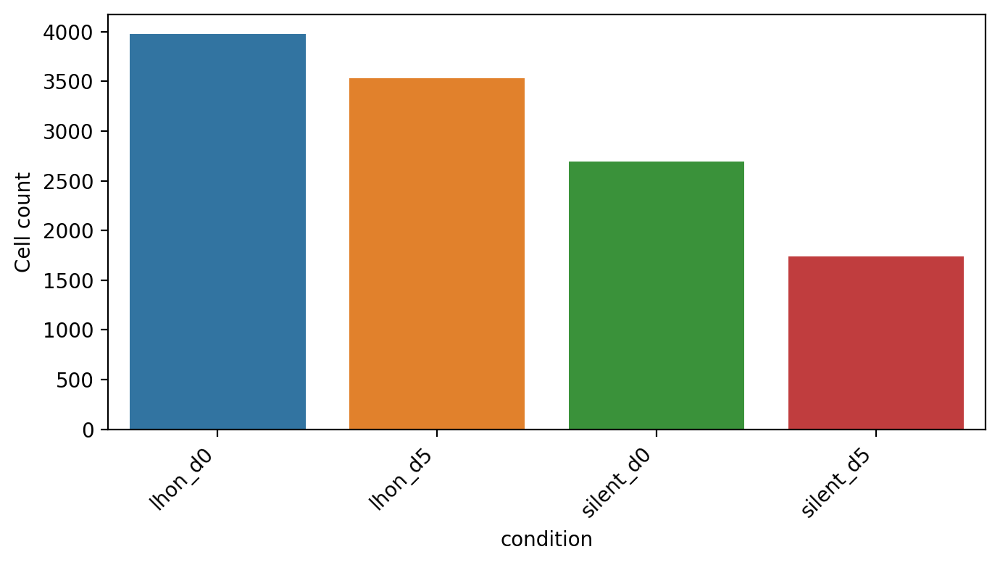

In [13]:
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(7,4))
xorder = sorted(valid_cells['condition'].unique())
seaborn.countplot(data=valid_cells, x='condition', order=xorder, ax=axes)
axes.set_xticklabels(axes.get_xticklabels(), ha='right', rotation=45)
axes.set_ylabel('Cell count')
fig.tight_layout()

## Total edits heteroplasmy

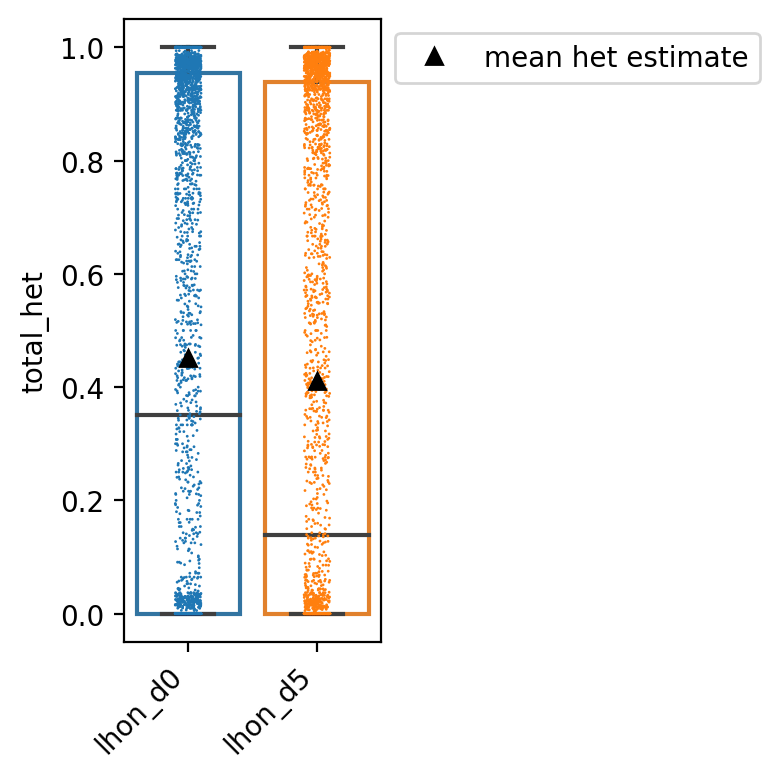

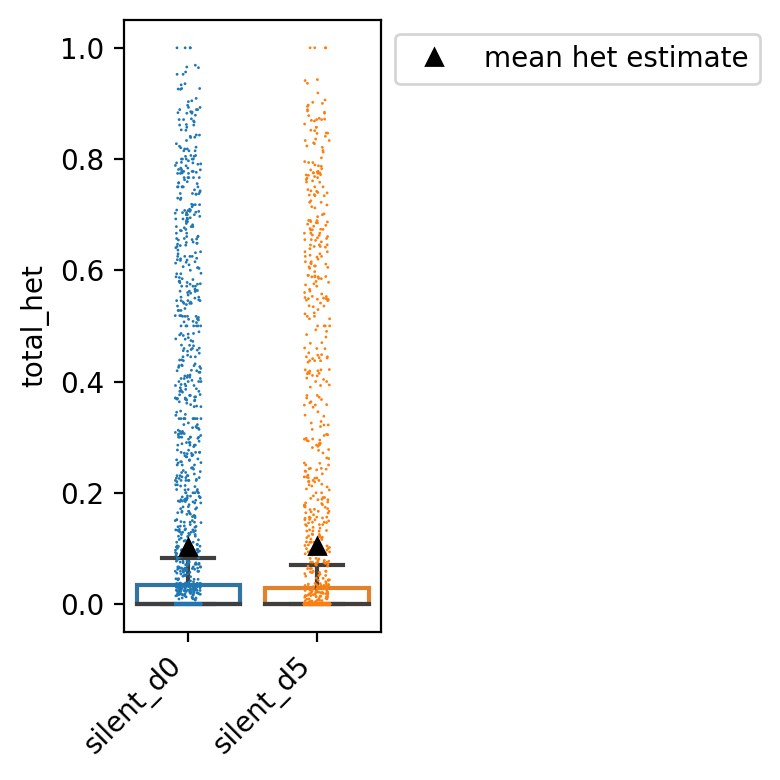

In [15]:
for editor in ['lhon', 'silent']:
    fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,4))
    xorder = [f'{editor}_d0', f'{editor}_d5']
    seaborn.boxplot(data=valid_cells, x='condition', y='total_het', ax=axes, order=xorder, showfliers=False)
    seaborn.stripplot(data=valid_cells, x='condition', y='total_het', dodge=True, s=1, order=xorder, ax=axes)
    axes.plot(numpy.arange(len(xorder)), valid_cells.groupby('condition')['total_het'].mean()[xorder],
              color='k', marker='^', linestyle='', zorder=100, label='mean het estimate')

    for patch in axes.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

    axes.set_xticklabels(axes.get_xticklabels(), ha='right', rotation=45)
    axes.set_xlabel('')
    axes.legend(loc='upper left', bbox_to_anchor=[1,1])

    fig.tight_layout()

### LHON + LHON/SILENT heteroplasmy

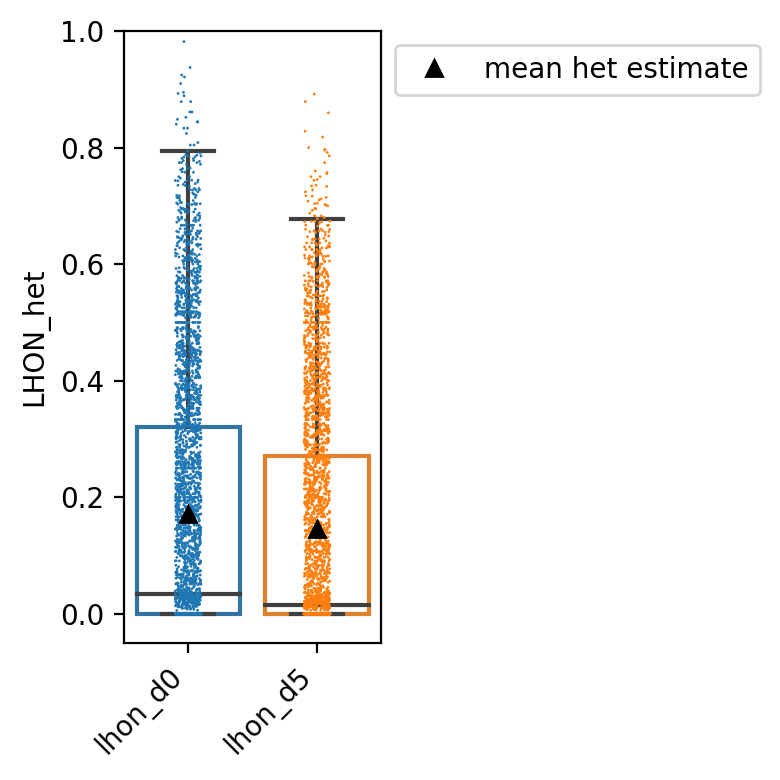

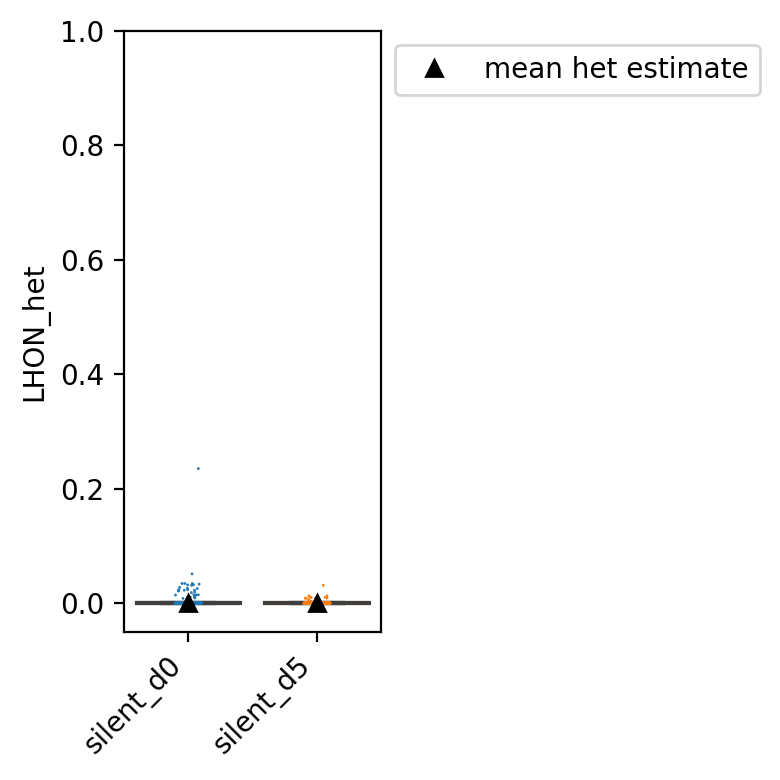

In [16]:
for editor in ['lhon', 'silent']:
    fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,4))
    xorder = [f'{editor}_d0', f'{editor}_d5']
    seaborn.boxplot(data=valid_cells, x='condition', y='LHON_het', ax=axes, order=xorder, showfliers=False)
    seaborn.stripplot(data=valid_cells, x='condition', y='LHON_het', dodge=True, s=1, order=xorder, ax=axes)
    axes.plot(numpy.arange(len(xorder)), valid_cells.groupby('condition')['LHON_het'].mean()[xorder],
              color='k', marker='^', linestyle='', zorder=100, label='mean het estimate')

    for patch in axes.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

    axes.set_xticklabels(axes.get_xticklabels(), ha='right', rotation=45)
    axes.set_xlabel('')
    axes.set_ylim(-0.05, 1.0)
    axes.legend(loc='upper left', bbox_to_anchor=[1,1])

    fig.tight_layout()

### Just SILENT heteroplasmy

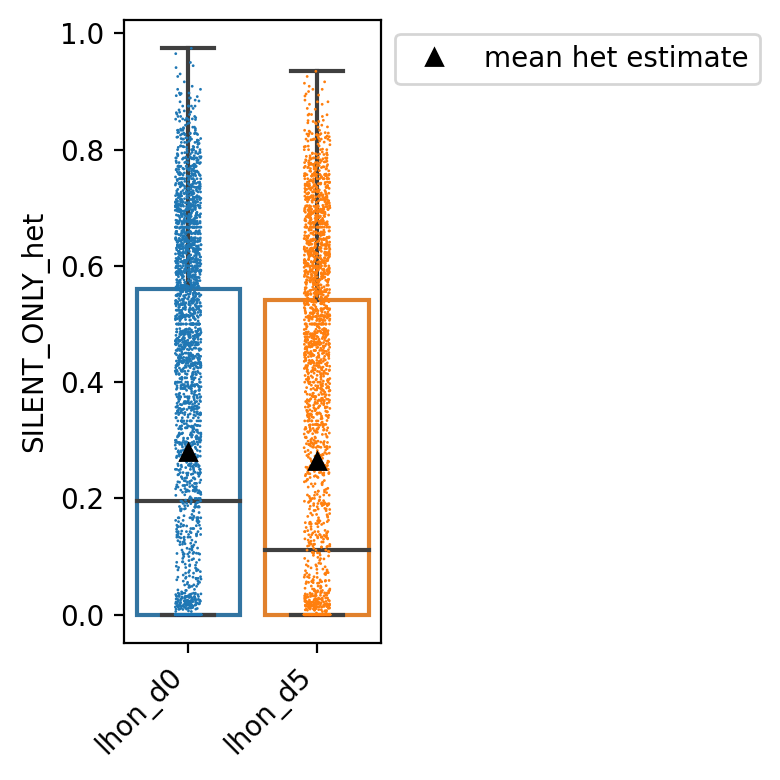

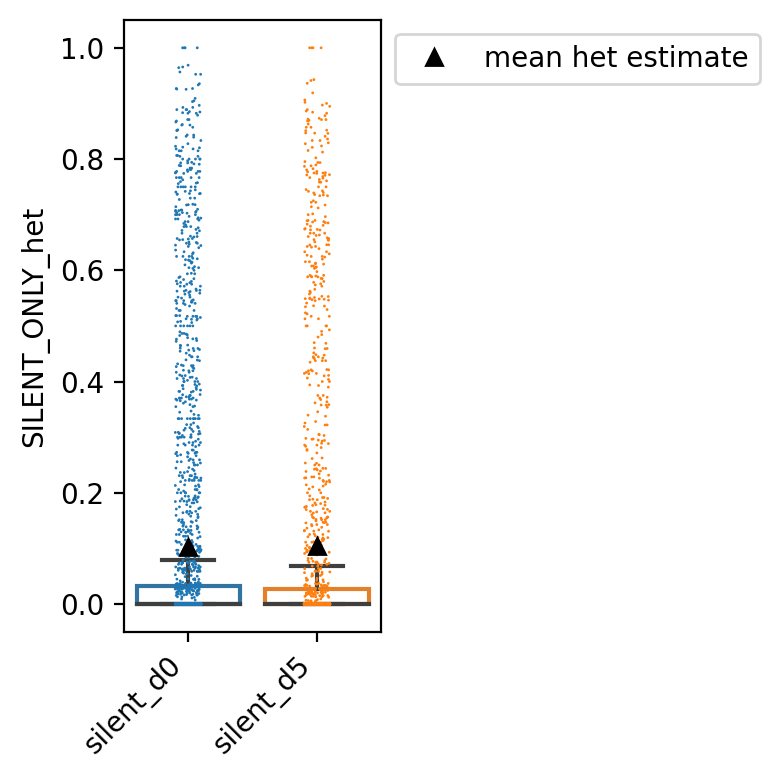

In [17]:
for editor in ['lhon', 'silent']:
    fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(4,4))
    xorder = [f'{editor}_d0', f'{editor}_d5']
    seaborn.boxplot(data=valid_cells, x='condition', y='SILENT_ONLY_het', ax=axes, order=xorder, showfliers=False)
    seaborn.stripplot(data=valid_cells, x='condition', y='SILENT_ONLY_het', dodge=True, s=1, order=xorder, ax=axes)
    axes.plot(numpy.arange(len(xorder)), valid_cells.groupby('condition')['SILENT_ONLY_het'].mean()[xorder],
              color='k', marker='^', linestyle='', zorder=100, label='mean het estimate')

    for patch in axes.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

    axes.set_xticklabels(axes.get_xticklabels(), ha='right', rotation=45)
    axes.set_xlabel('')
    axes.legend(bbox_to_anchor=[1,1])

    fig.tight_layout()

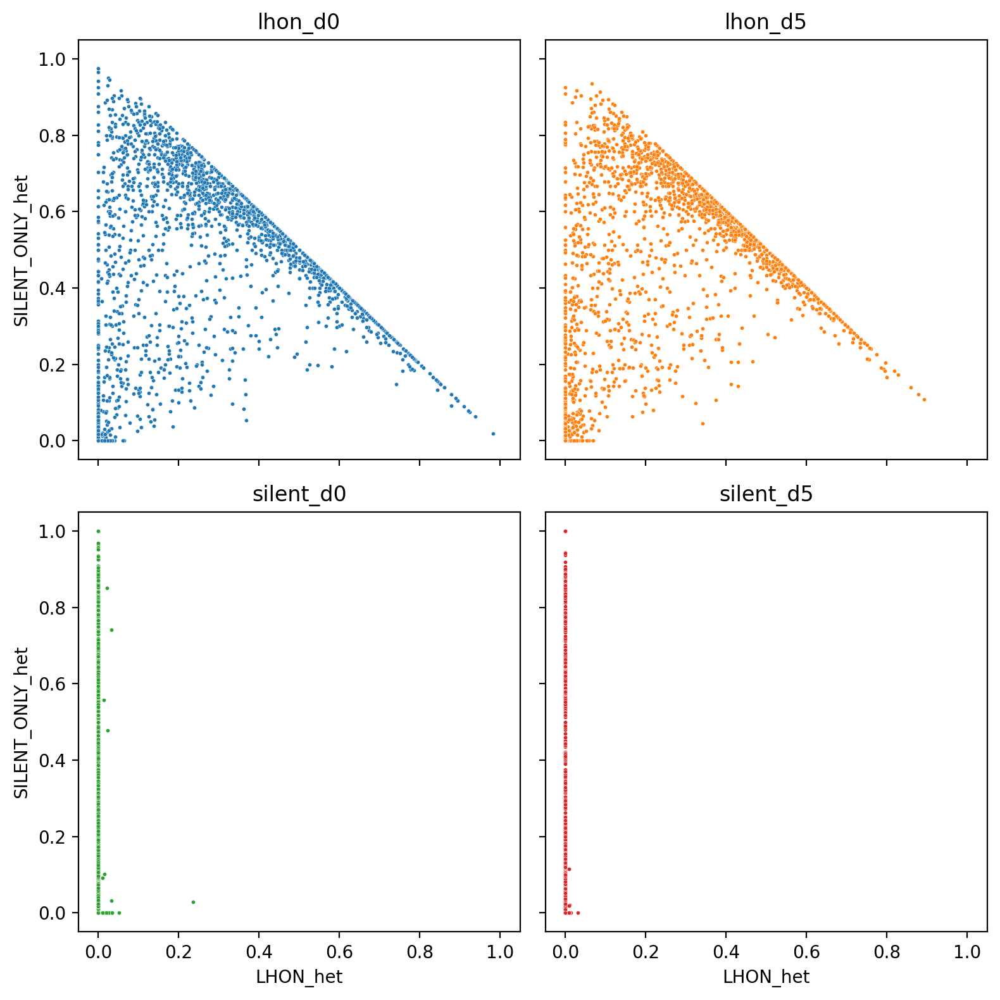

In [18]:
fig, axes = pyplot.subplots(nrows=2, ncols=2, figsize=(8,8), sharey=True, sharex=True)
xorder = ['lhon_d0', 'lhon_d5', 'silent_d0', 'silent_d5']
for idx, cond in enumerate(xorder):
    ax_idx = (idx//2, idx%2)
    seaborn.scatterplot(data=valid_cells.loc[valid_cells['condition'] == cond], 
                        x='LHON_het', y='SILENT_ONLY_het', color=f'C{idx}', s=5, ax=axes[ax_idx])
    axes[ax_idx].set_xlim((-0.05, 1.05))
    axes[ax_idx].set_ylim((-0.05, 1.05))
    axes[ax_idx].set_title(cond)
fig.tight_layout()

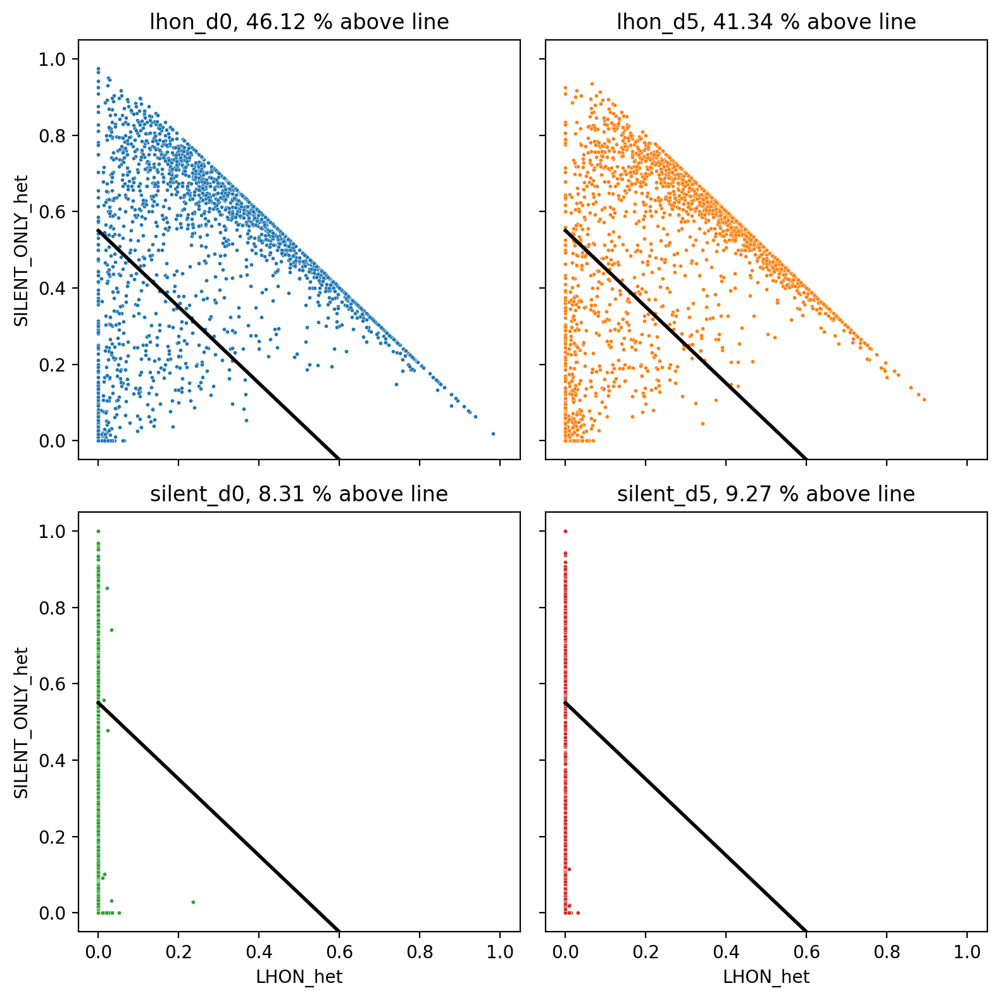

In [19]:
fig, axes = pyplot.subplots(nrows=2, ncols=2, figsize=(8,8), sharey=True, sharex=True)
xorder = ['lhon_d0', 'lhon_d5', 'silent_d0', 'silent_d5']
for idx, cond in enumerate(xorder):
    ax_idx = (idx//2, idx%2)
    to_plot_subset = valid_cells.loc[valid_cells['condition'] == cond]
    seaborn.scatterplot(data=to_plot_subset, x='LHON_het', y='SILENT_ONLY_het', 
                        color=f'C{idx}', s=5, ax=axes[ax_idx])
    xvals = numpy.arange(0,0.8,0.05)
    yvals = -1*xvals + 0.55
    above_line = [(-1*l_het + 0.55) < s_het 
                  for l_het, s_het in to_plot_subset[['LHON_het', 'SILENT_ONLY_het']].to_numpy()]
    pct_above = round((numpy.sum(above_line)/len(above_line))*100, 2)
    axes[ax_idx].plot(xvals, yvals, color='k', linewidth=2)
    axes[ax_idx].set_xlim((-0.05, 1.05))
    axes[ax_idx].set_ylim((-0.05, 1.05))
    axes[ax_idx].set_title(f'{cond}, {pct_above} % above line')
fig.tight_layout()

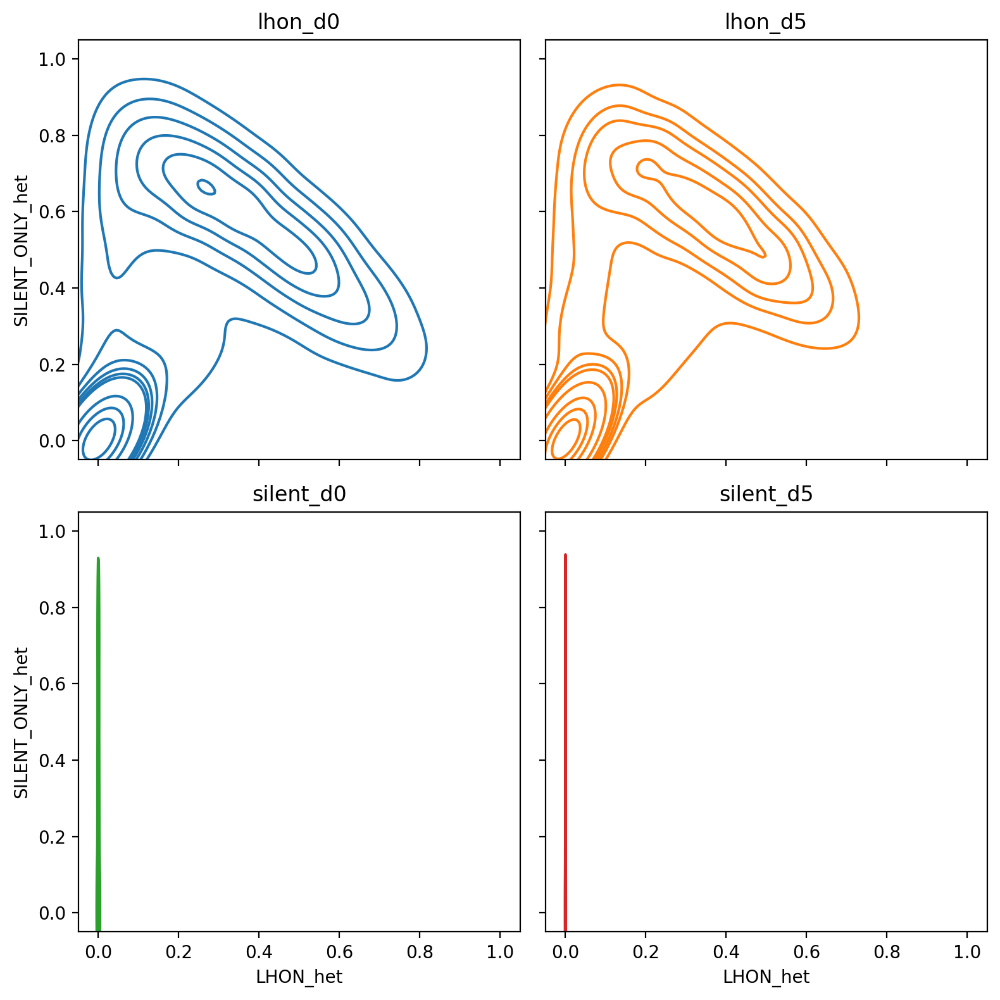

In [20]:
fig, axes = pyplot.subplots(nrows=2, ncols=2, figsize=(8,8), sharey=True, sharex=True)
xorder = ['lhon_d0', 'lhon_d5', 'silent_d0', 'silent_d5']
for idx, cond in enumerate(xorder):
    ax_idx = (idx//2, idx%2)
    to_plot_subset = valid_cells.loc[valid_cells['condition'] == cond]
    seaborn.kdeplot(data=to_plot_subset, x='LHON_het', y='SILENT_ONLY_het', 
                    color=f'C{idx}', ax=axes[ax_idx])
    axes[ax_idx].set_xlim((-0.05, 1.05))
    axes[ax_idx].set_ylim((-0.05, 1.05))
    axes[ax_idx].set_title(cond)
fig.tight_layout()

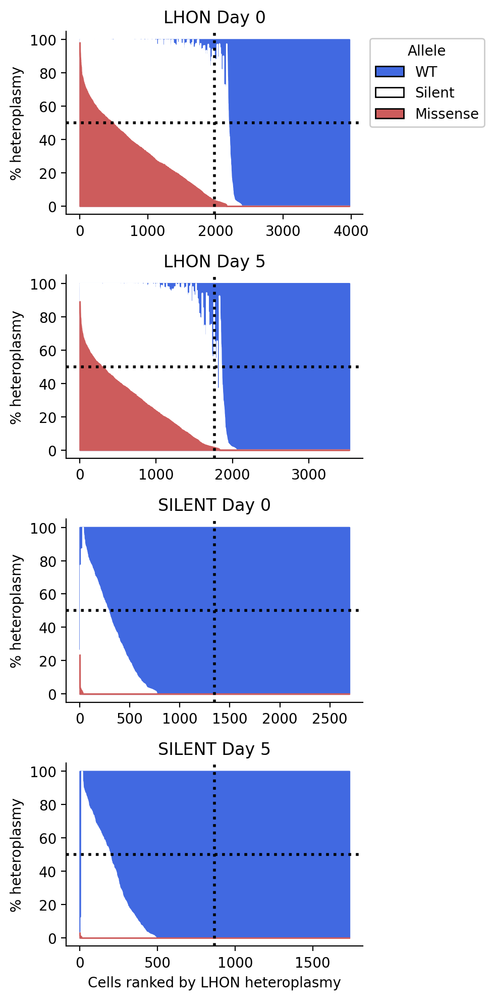

In [21]:
fig, axes = pyplot.subplots(nrows=4, ncols=1, figsize=(5,10))

for ax in axes:
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

d0_data = valid_cells[valid_cells['condition'] == 'lhon_d0'].sort_values(by=['LHON_het', 'SILENT_ONLY_het'], ascending=[False, False])
xvals = numpy.arange(d0_data.shape[0])
axes[0].fill_between(xvals, 1.0, color='royalblue', label='WT')
axes[0].fill_between(xvals, d0_data['total_het'].to_numpy(), color='white', label='Silent')
axes[0].fill_between(xvals, d0_data['LHON_het'].to_numpy(), color='indianred', label='Missense')
axes[0].axhline(0.5, linestyle='dotted', linewidth=2, color='k')
axes[0].axvline(len(xvals)/2, linestyle='dotted', linewidth=2, color='k')
axes[0].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[0].set_yticklabels([0, 20, 40, 60, 80, 100])
axes[0].set_ylabel('% heteroplasmy')
axes[0].set_title('LHON Day 0')

d5_data = valid_cells[valid_cells['condition'] == 'lhon_d5'].sort_values(by=['LHON_het', 'SILENT_ONLY_het'], ascending=[False, False])
xvals = numpy.arange(d5_data.shape[0])
axes[1].fill_between(xvals, 1.0, color='royalblue', label='WT')
axes[1].fill_between(xvals, d5_data['total_het'].to_numpy(), color='white', label='Silent')
axes[1].fill_between(xvals, d5_data['LHON_het'].to_numpy(), color='indianred', label='Missense')
axes[1].axhline(0.5, linestyle='dotted', linewidth=2, color='k')
axes[1].axvline(len(xvals)/2, linestyle='dotted', linewidth=2, color='k')
axes[1].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[1].set_yticklabels([0, 20, 40, 60, 80, 100])
axes[1].set_ylabel('% heteroplasmy')
axes[1].set_title('LHON Day 5')

d10_data = valid_cells[valid_cells['condition'] == 'silent_d0'].sort_values(by=['LHON_het', 'SILENT_ONLY_het'], ascending=[False, False])
xvals = numpy.arange(d10_data.shape[0])
axes[2].fill_between(xvals, 1.0, color='royalblue', label='WT')
axes[2].fill_between(xvals, d10_data['total_het'].to_numpy(), color='white', label='Silent')
axes[2].fill_between(xvals, d10_data['LHON_het'].to_numpy(), color='indianred', label='Missense')
axes[2].axhline(0.5, linestyle='dotted', linewidth=2, color='k')
axes[2].axvline(len(xvals)/2, linestyle='dotted', linewidth=2, color='k')
axes[2].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[2].set_yticklabels([0, 20, 40, 60, 80, 100])
axes[2].set_ylabel('% heteroplasmy')
#axes[2].set_xlabel('Cells ranked by LHON heteroplasmy')
axes[2].set_title('SILENT Day 0')

d15_data = valid_cells[valid_cells['condition'] == 'silent_d5'].sort_values(by=['LHON_het', 'SILENT_ONLY_het'], ascending=[False, False])
xvals = numpy.arange(d15_data.shape[0])
axes[3].fill_between(xvals, 1.0, color='royalblue', label='WT')
axes[3].fill_between(xvals, d15_data['total_het'].to_numpy(), color='white', label='Silent')
axes[3].fill_between(xvals, d15_data['LHON_het'].to_numpy(), color='indianred', label='Missense')
axes[3].axhline(0.5, linestyle='dotted', linewidth=2, color='k')
axes[3].axvline(len(xvals)/2, linestyle='dotted', linewidth=2, color='k')
axes[3].set_yticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes[3].set_yticklabels([0, 20, 40, 60, 80, 100])
axes[3].set_ylabel('% heteroplasmy')
axes[3].set_xlabel('Cells ranked by LHON heteroplasmy')
axes[3].set_title('SILENT Day 5')

axes[0].legend(loc='upper left', bbox_to_anchor=[1,1], title='Allele', framealpha=1.0)
for ha in axes[0].legend_.legendHandles:
    ha.set_edgecolor('k')

fig.tight_layout()

### Check lineage tracing barcodes

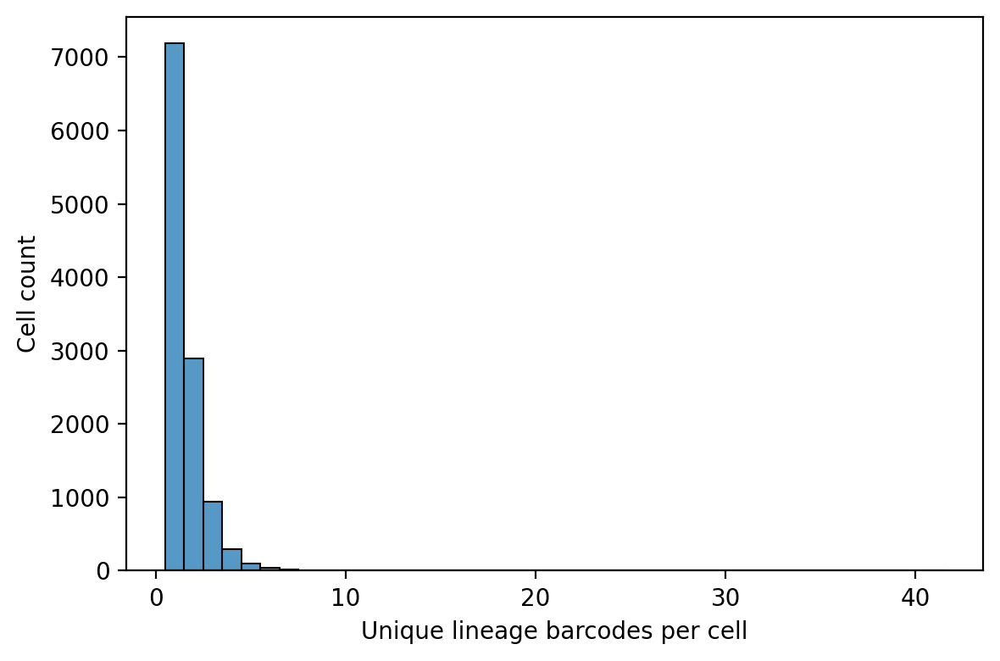

In [22]:
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.histplot(data=valid_cells, x='tracer_type_count', discrete=True, ax=axes)
axes.set_xlabel('Unique lineage barcodes per cell')
axes.set_ylabel('Cell count')
fig.tight_layout()

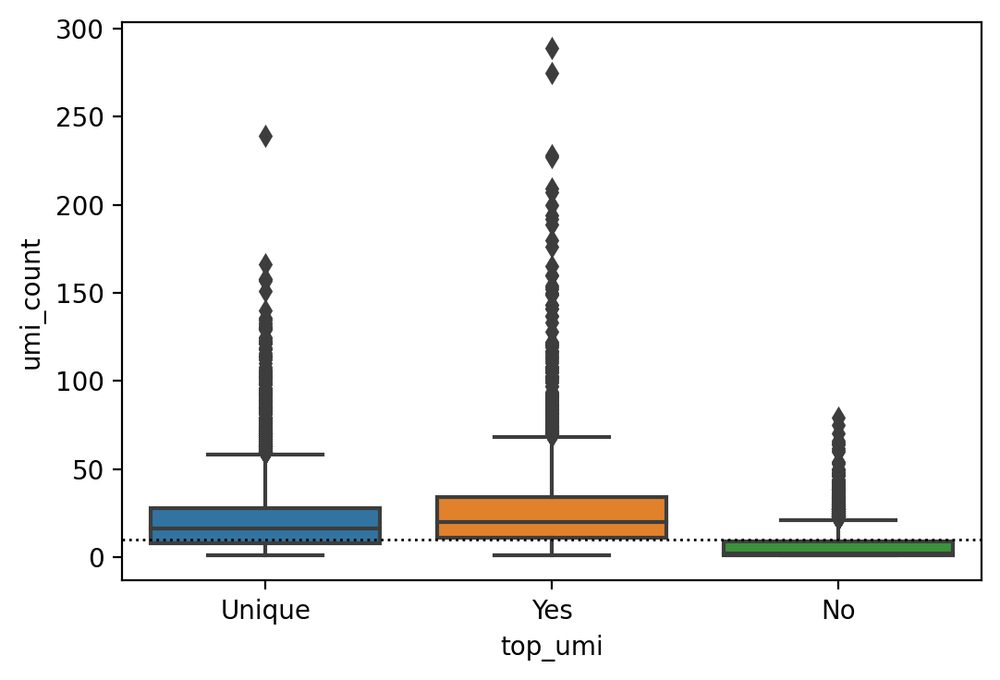

In [23]:
unique_tracer_idx = (~valid_cells['top1_tracer_sequence'].isnull()) & (valid_cells['top2_tracer_sequence'].isnull())
multi_tracer_idx = (~valid_cells['top1_tracer_sequence'].isnull()) & (~valid_cells['top2_tracer_sequence'].isnull())
to_plot = pandas.concat([pandas.DataFrame({'umi_count':valid_cells.loc[unique_tracer_idx, 'top1_tracer_count'],
                                           'top_umi':['Unique']*numpy.sum(unique_tracer_idx)}),
                         pandas.DataFrame({'umi_count':valid_cells.loc[multi_tracer_idx, 'top1_tracer_count'],
                                           'top_umi':['Yes']*numpy.sum(multi_tracer_idx)}),
                         pandas.DataFrame({'umi_count':valid_cells.loc[multi_tracer_idx, 'top2_tracer_count'],
                                           'top_umi':['No']*numpy.sum(multi_tracer_idx)})])
to_plot['cell_id'] = numpy.hstack([valid_cells.loc[unique_tracer_idx, 'cell_id'].values,
                                   valid_cells.loc[multi_tracer_idx, 'cell_id'].values,
                                   valid_cells.loc[multi_tracer_idx, 'cell_id'].values])
ax = seaborn.boxplot(data=to_plot, x='top_umi', y='umi_count', 
                     order=['Unique', 'Yes', 'No'])
ax.axhline(10, color='k', linestyle='dotted', linewidth=1)

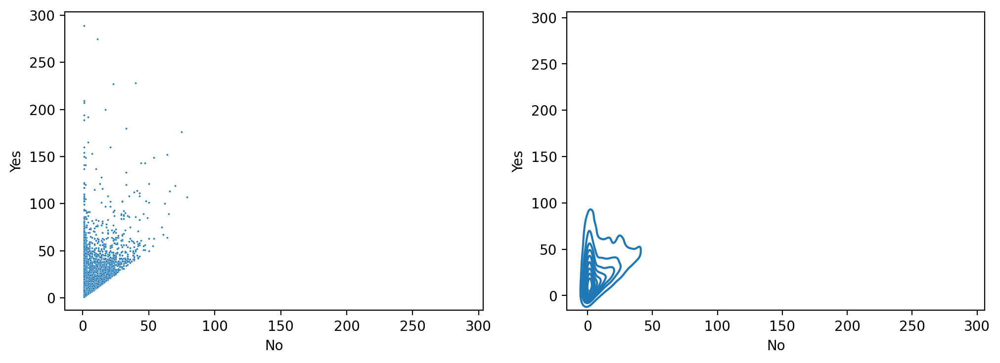

In [24]:
to_plot_wide = to_plot.pivot(index='cell_id', columns='top_umi', values='umi_count')
fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(12,4))
seaborn.scatterplot(data=to_plot_wide, x='No', y='Yes', s=2, ax=axes[0])
seaborn.kdeplot(data=to_plot_wide, x='No', y='Yes', ax=axes[1])
for ax in axes:
    ax.set_xlim(ax.get_ylim())

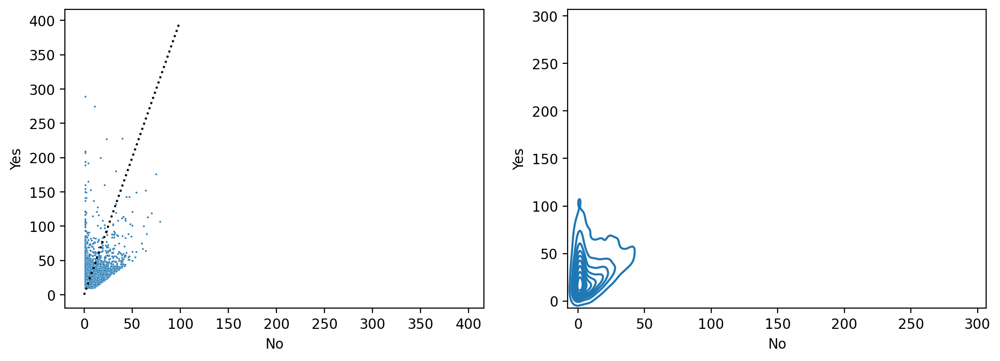

In [25]:
to_plot_wide_ge10 = to_plot_wide.query('Yes >= 10')
fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(12,4))
seaborn.scatterplot(data=to_plot_wide_ge10, x='No', y='Yes', s=2, ax=axes[0])
seaborn.kdeplot(data=to_plot_wide_ge10, x='No', y='Yes', ax=axes[1])
axes[0].plot(numpy.arange(100), 4*numpy.arange(100), linestyle='dotted', color='k')
for ax in axes:
    ax.set_xlim(ax.get_ylim())

In [26]:
print(numpy.sum(valid_cells['tracer_type_count'] > 1))
print(numpy.sum(valid_cells['tracer_type_count'] == 1))
print(valid_cells.shape)

4306
7188
(11941, 21)


In [27]:
#num barcodes removed by 10 UMI threshold
to_plot_wide.query('Unique < 10').index.nunique()

2115

In [28]:
#num barcodes rescued by 4x difference threshold between top and second
# barcode in multi-barcode cells
(to_plot_wide.query('Yes >= 10')
 .query('Yes > (4 * No)')).index.nunique()

2073

In [29]:
cells_w_good_lineage_bcs = (to_plot_wide.query('((Yes >= 10) | (Unique >= 10))')
                            .query('(Unique > 0) | (Yes > (4 * No))')).index.to_list()
valid_cells_filt = valid_cells.loc[valid_cells['cell_id'].isin(cells_w_good_lineage_bcs)].copy()
print(valid_cells_filt.shape)
valid_cells_filt.head()

(7146, 21)


,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,tracer,tracer_umi_count,tracer_type_count,top1_tracer_sequence,top2_tracer_sequence,top1_tracer_count,top2_tracer_count,umi_count_for_filtering,umi_count_rank,tracer_het,LHON_het,SILENT_het,SILENT_ONLY_het,total_het
0,A1-CATCAAGT-TGCGGCGC,lhon_d0,98,0,64,20,0,14,14.0,1.0,ATCCCCAAAGAGGA+TGTGGTCATGTGACACTGCAGTACTGACTG,NaN,14.0,NaN,84,1739,0.142857,0.761905,1.00000,0.238095,1.00000
1,A1-AACAACCA-TATTATAA,silent_d0,51,0,0,0,32,19,19.0,2.0,ACACGCAGGAAACT+TGTGCAACACGTTGACTGCAACTGACGTCA,GACATGCGGCTTGT+ACTGACACTGCAACCAGTCAGTTGGTACCA,18.0,1.0,32,9939,0.372549,0.000000,0.00000,0.000000,0.00000
2,A1-CGCTGATC-GTAGCTAA,lhon_d0,106,0,0,0,59,47,47.0,2.0,TTTAAGATTGTGGA+TGGTCAGTTGCATGGTACGTACACGTACAC,TTCGCGTAGCGGAG+CAGTACACCATGACTGACTGACCAGTCATG,46.0,1.0,59,3766,0.443396,0.000000,0.00000,0.000000,0.00000
4,A1-AAGACGGA-TCCTCGGA,silent_d0,46,0,0,5,26,15,15.0,2.0,CGCAGCCGTTGTAG+CACACATGTGCATGCAACACTGCAGTACAC,CCTTCCGAGCGTAA+TGCAACCAACCATGACCAGTCACATGTGCA,14.0,1.0,31,10170,0.326087,0.000000,0.16129,0.161290,0.16129
5,A1-AGTACAAG-CGGACGGC,lhon_d0,82,0,0,0,49,33,33.0,1.0,TAACGCGTCTGGAT+TGCATGCACAGTGTCAGTACACACTGCAGT,NaN,33.0,NaN,49,5405,0.402439,0.000000,0.00000,0.000000,0.00000


In [30]:
cells_per_bc = valid_cells_filt.groupby('top1_tracer_sequence')['cell_id'].nunique()
cells_per_bc.head()

top1_tracer_sequence
AAATCTGGAAATCT+ACACACACTGACTGGTACTGCAGTGTACTG    1
AAATCTGGAAATCT+ACACGTCATGGTCAACACTGTGCAACTGTG    1
AAATCTGGAAATCT+ACACTGCAACGTTGACGTTGTGTGCAACAC    1
AAATCTGGAAATCT+ACCAACACTGGTACCACAGTTGACCAGTTG    1
AAATCTGGAAATCT+ACCATGGTACCAACTGGTACGTGTTGGTAC    2
Name: cell_id, dtype: int64

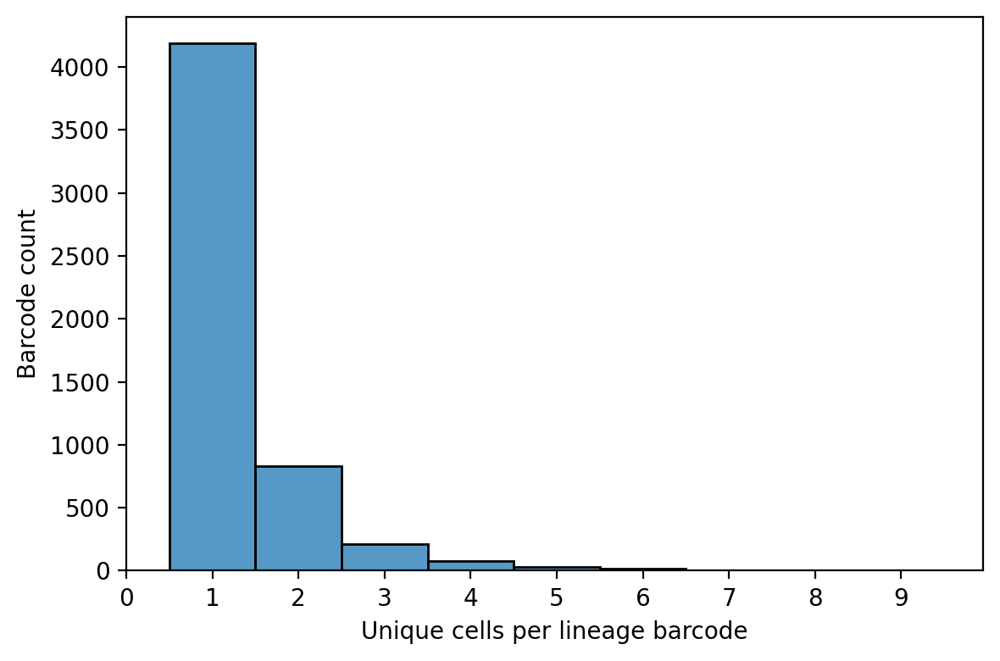

In [31]:
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.histplot(x=cells_per_bc.values, discrete=True, ax=axes)
axes.set_xticks(numpy.arange(cells_per_bc.max()+1))
axes.set_xlabel('Unique cells per lineage barcode')
axes.set_ylabel('Barcode count')
fig.tight_layout()

In [32]:
cells_per_bc.sort_values(ascending=False).value_counts()

1    4188
2     828
3     214
4      79
5      33
6      16
7       6
8       4
9       1
Name: cell_id, dtype: int64

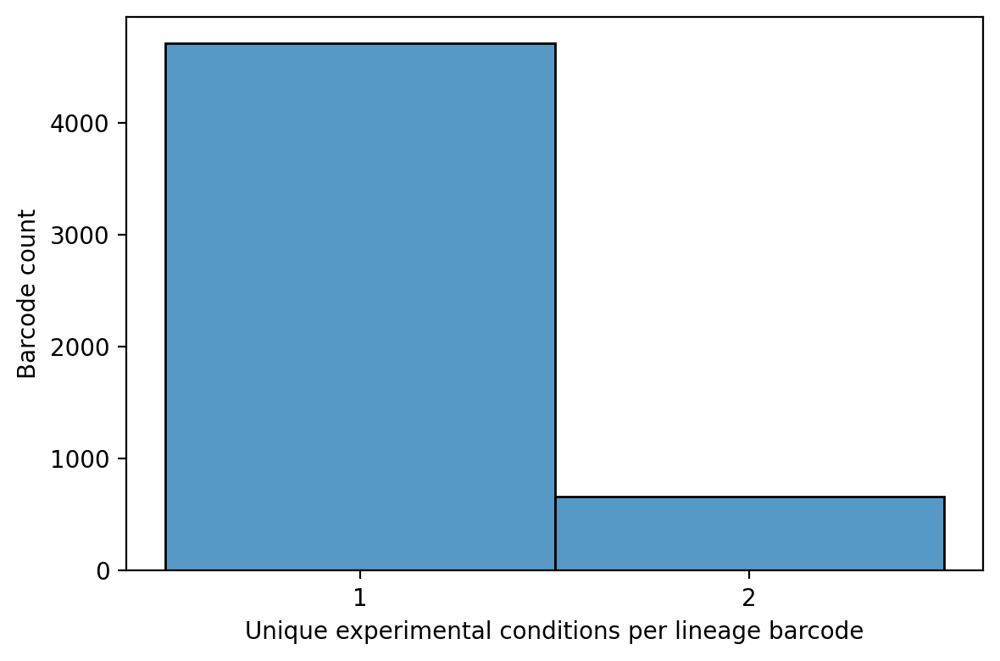

In [33]:
condition_per_linbc = valid_cells_filt.groupby('top1_tracer_sequence')['condition'].nunique()

fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.histplot(x=condition_per_linbc.values, discrete=True, ax=axes)
axes.set_xticks(numpy.arange(1, 3))
axes.set_xlabel('Unique experimental conditions per lineage barcode')
axes.set_ylabel('Barcode count')
fig.tight_layout()

In [34]:
condition_per_linbc.value_counts()

1    4709
2     660
Name: condition, dtype: int64

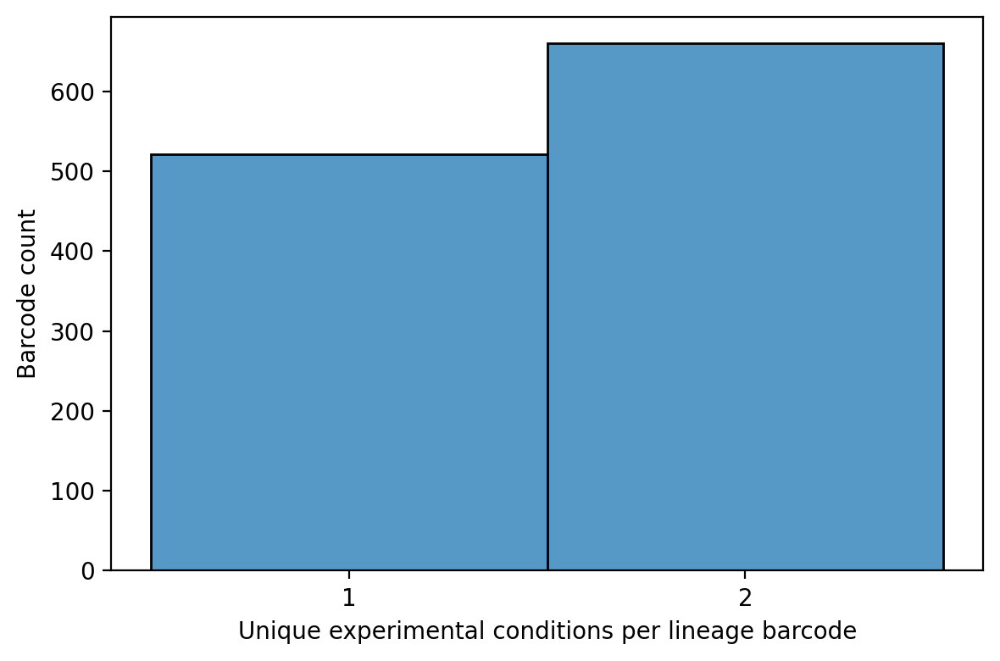

In [35]:
condition_per_linbc = (valid_cells_filt[valid_cells_filt['top1_tracer_sequence'].isin(cells_per_bc[cells_per_bc > 1].index.values)]
                       .groupby('top1_tracer_sequence')['condition'].nunique())

fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
seaborn.histplot(x=condition_per_linbc.values, discrete=True, ax=axes)
axes.set_xticks(numpy.arange(1, 3))
axes.set_xlabel('Unique experimental conditions per lineage barcode')
axes.set_ylabel('Barcode count')
fig.tight_layout()

In [36]:
condition_per_linbc.value_counts()

2    660
1    521
Name: condition, dtype: int64

In [37]:
valid_cells_filt['condition_code'] = 0
valid_cells_filt.loc[valid_cells_filt['condition'] == 'lhon_d5', 'condition_code'] = 1
valid_cells_filt.loc[valid_cells_filt['condition'] == 'silent_d0', 'condition_code'] = 2
valid_cells_filt.loc[valid_cells_filt['condition'] == 'silent_d5', 'condition_code'] = 3

In [38]:
multi_type_linbcs = valid_cells_filt.loc[valid_cells_filt['top1_tracer_sequence'].isin(condition_per_linbc[condition_per_linbc > 1].index.values)]
print(multi_type_linbcs.shape)

(1808, 22)


In [42]:
valid_cells_filt['multi_type_linbc'] = valid_cells_filt.index.isin(multi_type_linbcs.index)
print(valid_cells_filt.shape)
valid_cells_filt.head()

(7146, 23)


,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,tracer,tracer_umi_count,tracer_type_count,top1_tracer_sequence,top2_tracer_sequence,top1_tracer_count,top2_tracer_count,umi_count_for_filtering,umi_count_rank,tracer_het,LHON_het,SILENT_het,SILENT_ONLY_het,total_het,condition_code,multi_type_linbc
0,A1-CATCAAGT-TGCGGCGC,lhon_d0,98,0,64,20,0,14,14.0,1.0,ATCCCCAAAGAGGA+TGTGGTCATGTGACACTGCAGTACTGACTG,NaN,14.0,NaN,84,1739,0.142857,0.761905,1.00000,0.238095,1.00000,0,False
1,A1-AACAACCA-TATTATAA,silent_d0,51,0,0,0,32,19,19.0,2.0,ACACGCAGGAAACT+TGTGCAACACGTTGACTGCAACTGACGTCA,GACATGCGGCTTGT+ACTGACACTGCAACCAGTCAGTTGGTACCA,18.0,1.0,32,9939,0.372549,0.000000,0.00000,0.000000,0.00000,2,False
2,A1-CGCTGATC-GTAGCTAA,lhon_d0,106,0,0,0,59,47,47.0,2.0,TTTAAGATTGTGGA+TGGTCAGTTGCATGGTACGTACACGTACAC,TTCGCGTAGCGGAG+CAGTACACCATGACTGACTGACCAGTCATG,46.0,1.0,59,3766,0.443396,0.000000,0.00000,0.000000,0.00000,0,False
4,A1-AAGACGGA-TCCTCGGA,silent_d0,46,0,0,5,26,15,15.0,2.0,CGCAGCCGTTGTAG+CACACATGTGCATGCAACACTGCAGTACAC,CCTTCCGAGCGTAA+TGCAACCAACCATGACCAGTCACATGTGCA,14.0,1.0,31,10170,0.326087,0.000000,0.16129,0.161290,0.16129,2,False
5,A1-AGTACAAG-CGGACGGC,lhon_d0,82,0,0,0,49,33,33.0,1.0,TAACGCGTCTGGAT+TGCATGCACAGTGTCAGTACACACTGCAGT,NaN,33.0,NaN,49,5405,0.402439,0.000000,0.00000,0.000000,0.00000,0,False


In [43]:
valid_cells_filt.to_csv('./heteroplasmy_dataframe_w_lineage_bc_info.csv')

## Compare conditions and make paper figures

In [5]:
legend_labels = {'lhon_d0_False':'LHON-edited d0, single-tp bcs',
                 'lhon_d0_True':'LHON-edited d0, multi-tp bcs',
                 'lhon_d5_False':'LHON-edited d5, single-tp bcs',
                 'lhon_d5_True':'LHON-edited d5, multi-tp bcs',
                 'silent_d0_False':'SILENT-edited d0, single-tp bcs',
                 'silent_d0_True':'SILENT-edited d0, multi-tp bcs',
                 'silent_d5_False':'SILENT-edited d5, single-tp bcs',
                 'silent_d5_True':'SILENT-edited d5, multi-tp bcs'}

valid_cells_filt['day_vs_bc_class'] = valid_cells_filt['condition'] + '_' + valid_cells_filt['multi_type_linbc'].astype(str)
valid_cells_filt['day_vs_bc_class_disp'] = [legend_labels[elt] for elt in valid_cells_filt['day_vs_bc_class'].values]

In [6]:
to_plot = valid_cells_filt[valid_cells_filt['condition'].str.startswith('lhon')
                            & (valid_cells_filt['LHON_het'] > 0)].sort_values(by=['condition', 'multi_type_linbc'])
px.ecdf(to_plot, x='LHON_het', color='day_vs_bc_class_disp')

In [7]:
to_plot['ecdf_order'] = (to_plot.sort_values(by='LHON_het')
                         .groupby('day_vs_bc_class')
                         .cumcount()
                         .rename('ecdf_order'))
to_plot['ecdf_prob'] = to_plot['ecdf_order'].divide(to_plot.groupby('day_vs_bc_class')['ecdf_order'].transform('max'))
cols_to_save = ['day_vs_bc_class', 'ecdf_order', 'ecdf_prob', 'LHON_het']
to_plot.sort_values(by=['day_vs_bc_class', 'ecdf_order'])[cols_to_save].to_csv('lhon_edited_lhon_het_ecdf_data.csv', index=False)

In [8]:
stats.ks_2samp(to_plot.loc[to_plot['day_vs_bc_class'] == 'lhon_d0_False', 'LHON_het'].values,
               to_plot.loc[to_plot['day_vs_bc_class'] == 'lhon_d0_True', 'LHON_het'].values)

KstestResult(statistic=0.1384481784752295, pvalue=1.3732201123661802e-05)

In [9]:
to_plot = valid_cells_filt[valid_cells_filt['condition'].str.startswith('lhon')
                            & (valid_cells_filt['SILENT_ONLY_het'] > 0)].sort_values(by=['condition', 'multi_type_linbc'])
px.ecdf(to_plot, x='SILENT_ONLY_het', color='day_vs_bc_class_disp')

In [10]:
to_plot['ecdf_order'] = (to_plot.sort_values(by='SILENT_ONLY_het')
                         .groupby('day_vs_bc_class')
                         .cumcount()
                         .rename('ecdf_order'))
to_plot['ecdf_prob'] = to_plot['ecdf_order'].divide(to_plot.groupby('day_vs_bc_class')['ecdf_order'].transform('max'))
cols_to_save = ['day_vs_bc_class', 'ecdf_order', 'ecdf_prob', 'SILENT_ONLY_het']
to_plot.sort_values(by=['day_vs_bc_class', 'ecdf_order'])[cols_to_save].to_csv('lhon_edited_silent_het_ecdf_data.csv', index=False)

In [11]:
stats.ks_2samp(to_plot.loc[to_plot['day_vs_bc_class'] == 'lhon_d0_False', 'SILENT_ONLY_het'].values,
               to_plot.loc[to_plot['day_vs_bc_class'] == 'lhon_d0_True', 'SILENT_ONLY_het'].values)

KstestResult(statistic=0.129206299972429, pvalue=3.969879533005649e-05)

In [12]:
to_plot = valid_cells_filt[valid_cells_filt['condition'].str.startswith('silent')
                            & (valid_cells_filt['SILENT_ONLY_het'] > 0)].sort_values(by=['condition', 'multi_type_linbc'])
px.ecdf(to_plot, x='SILENT_ONLY_het', color='day_vs_bc_class_disp')

In [13]:
to_plot['ecdf_order'] = (to_plot.sort_values(by='SILENT_ONLY_het')
                         .groupby('day_vs_bc_class')
                         .cumcount()
                         .rename('ecdf_order'))
to_plot['ecdf_prob'] = to_plot['ecdf_order'].divide(to_plot.groupby('day_vs_bc_class')['ecdf_order'].transform('max'))
cols_to_save = ['day_vs_bc_class', 'ecdf_order', 'ecdf_prob', 'SILENT_ONLY_het']
to_plot.sort_values(by=['day_vs_bc_class', 'ecdf_order'])[cols_to_save].to_csv('silent_edited_silent_het_ecdf_data.csv', index=False)

In [14]:
stats.ks_2samp(to_plot.loc[to_plot['day_vs_bc_class'] == 'silent_d0_False', 'SILENT_ONLY_het'].values,
               to_plot.loc[to_plot['day_vs_bc_class'] == 'silent_d0_True', 'SILENT_ONLY_het'].values)

KstestResult(statistic=0.1302919708029197, pvalue=0.5080484294772319)

In [15]:
valid_cells_filt['editor'] = [elt.split('_')[0] for elt in valid_cells_filt['condition'].values]

In [16]:
multiday_bc_valid_cells = valid_cells_filt[valid_cells_filt['multi_type_linbc']].copy()

In [17]:
multiday_bc_valid_cells.head()

,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,tracer,tracer_umi_count,tracer_type_count,top1_tracer_sequence,top2_tracer_sequence,top1_tracer_count,top2_tracer_count,umi_count_for_filtering,umi_count_rank,tracer_het,LHON_het,SILENT_het,SILENT_ONLY_het,total_het,condition_code,multi_type_linbc,batch,day_vs_bc_class,day_vs_bc_class_disp,editor
9,A1-CATACCAA-CTAGAATG,lhon_d5,247,0,0,0,196,51,51.0,1.0,TGGCGTCGACACGA+TGGTACCAACTGTGTGACGTTGACACCAGT,NaN,51.0,NaN,196,151,0.206478,0.000000,0.000000,0.000000,0.000000,1,True,1,lhon_d5_True,"LHON-edited d5, multi-tp bcs",lhon
14,A1-ACCTCCAA-TGCGGCGC,silent_d0,166,0,0,0,80,86,86.0,2.0,TAACTTCGCCTGCT+TGCAGTCAGTGTCACACAACTGACTGCACA,TCACTAAACACCTA+GTGTGTACTGTGGTCATGACCACAACTGAC,84.0,2.0,80,1978,0.518072,0.000000,0.000000,0.000000,0.000000,2,True,1,silent_d0_True,"SILENT-edited d0, multi-tp bcs",silent
25,A1-ACATTGGC-TAATCGGC,lhon_d0,65,0,2,19,6,38,38.0,2.0,TGATCTCCCATAAT+GTTGGTCATGACGTACACACTGGTACACTG,ATAGGATGTTTACA+ACTGGTTGACTGTGTGACACGTTGACCACA,36.0,2.0,27,11631,0.584615,0.074074,0.777778,0.703704,0.777778,0,True,1,lhon_d0_True,"LHON-edited d0, multi-tp bcs",lhon
31,A1-AGTACAAG-GCCACCTA,lhon_d0,90,2,23,25,0,40,40.0,1.0,TCACTAAACACCTA+CACATGCATGCATGCAACACTGCATGTGAC,NaN,40.0,NaN,50,5210,0.444444,0.500000,0.960000,0.500000,1.000000,0,True,1,lhon_d0_True,"LHON-edited d0, multi-tp bcs",lhon
36,A1-ATCCTGTA-TAACCTTC,lhon_d5,66,0,0,0,31,35,35.0,2.0,TGTTGACGGGAGTA+GTACCATGGTTGCATGACGTCACAACACGT,TGCCTTTGTTATAA+ACACACGTGTCAGTACTGGTCACATGACGT,33.0,2.0,31,10168,0.530303,0.000000,0.000000,0.000000,0.000000,1,True,1,lhon_d5_True,"LHON-edited d5, multi-tp bcs",lhon


In [18]:
multiday_bc_valid_cells['top1_tracer_sequence'].nunique()

720

In [20]:
multiday_bc_valid_cells.head()

,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,tracer,tracer_umi_count,tracer_type_count,top1_tracer_sequence,top2_tracer_sequence,top1_tracer_count,top2_tracer_count,umi_count_for_filtering,umi_count_rank,tracer_het,LHON_het,SILENT_het,SILENT_ONLY_het,total_het,condition_code,multi_type_linbc,batch,day_vs_bc_class,day_vs_bc_class_disp,editor
9,A1-CATACCAA-CTAGAATG,lhon_d5,247,0,0,0,196,51,51.0,1.0,TGGCGTCGACACGA+TGGTACCAACTGTGTGACGTTGACACCAGT,NaN,51.0,NaN,196,151,0.206478,0.000000,0.000000,0.000000,0.000000,1,True,1,lhon_d5_True,"LHON-edited d5, multi-tp bcs",lhon
14,A1-ACCTCCAA-TGCGGCGC,silent_d0,166,0,0,0,80,86,86.0,2.0,TAACTTCGCCTGCT+TGCAGTCAGTGTCACACAACTGACTGCACA,TCACTAAACACCTA+GTGTGTACTGTGGTCATGACCACAACTGAC,84.0,2.0,80,1978,0.518072,0.000000,0.000000,0.000000,0.000000,2,True,1,silent_d0_True,"SILENT-edited d0, multi-tp bcs",silent
25,A1-ACATTGGC-TAATCGGC,lhon_d0,65,0,2,19,6,38,38.0,2.0,TGATCTCCCATAAT+GTTGGTCATGACGTACACACTGGTACACTG,ATAGGATGTTTACA+ACTGGTTGACTGTGTGACACGTTGACCACA,36.0,2.0,27,11631,0.584615,0.074074,0.777778,0.703704,0.777778,0,True,1,lhon_d0_True,"LHON-edited d0, multi-tp bcs",lhon
31,A1-AGTACAAG-GCCACCTA,lhon_d0,90,2,23,25,0,40,40.0,1.0,TCACTAAACACCTA+CACATGCATGCATGCAACACTGCATGTGAC,NaN,40.0,NaN,50,5210,0.444444,0.500000,0.960000,0.500000,1.000000,0,True,1,lhon_d0_True,"LHON-edited d0, multi-tp bcs",lhon
36,A1-ATCCTGTA-TAACCTTC,lhon_d5,66,0,0,0,31,35,35.0,2.0,TGTTGACGGGAGTA+GTACCATGGTTGCATGACGTCACAACACGT,TGCCTTTGTTATAA+ACACACGTGTCAGTACTGGTCACATGACGT,33.0,2.0,31,10168,0.530303,0.000000,0.000000,0.000000,0.000000,1,True,1,lhon_d5_True,"LHON-edited d5, multi-tp bcs",lhon


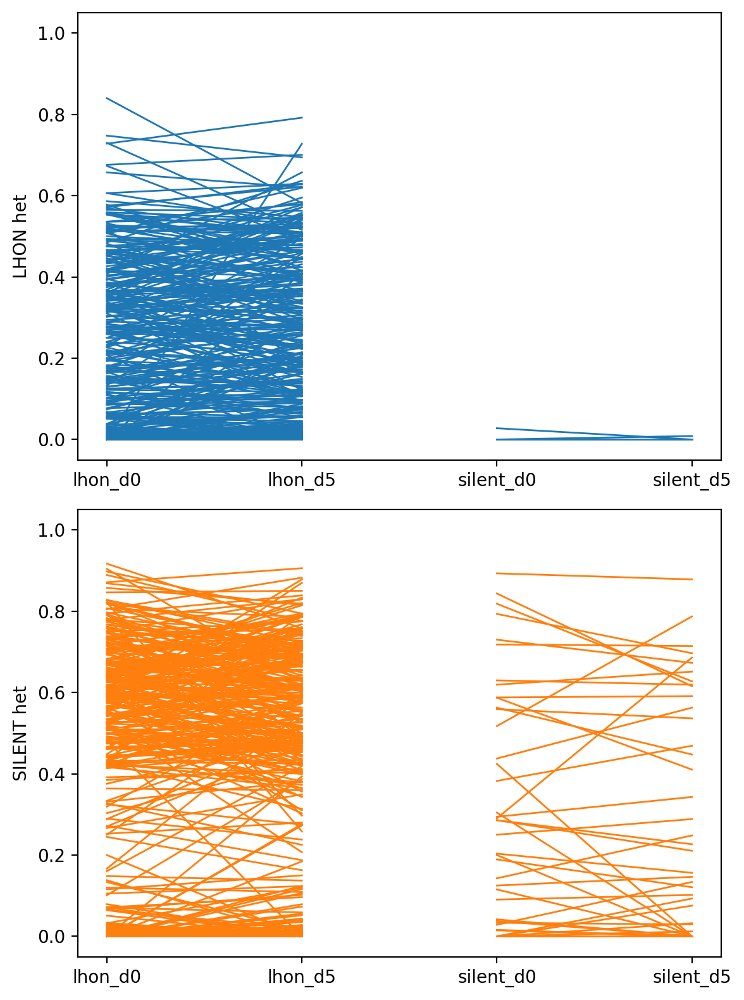

In [21]:
lineage_bc_df = {'from_bc1':[],
                 'to_bc1':[],
                 'from_mt_umi_cov':[],
                 'to_mt_umi_cov':[],
                 'from_lhon_het':[],
                 'to_lhon_het':[],
                 'from_silent_het':[],
                 'to_silent_het':[]}

fig, axes = pyplot.subplots(nrows=2, ncols=1, figsize=(6,8))
for lineage_bc in multiday_bc_valid_cells['top1_tracer_sequence'].unique():
    bc_idx = multiday_bc_valid_cells['top1_tracer_sequence'] == lineage_bc
    
    #compute mean coverage of cells at days 0 and 5 for each lineage barcode
    mt_umi_cov = (multiday_bc_valid_cells.loc[bc_idx]
                  .groupby(['condition', 'condition_code'])['umi_count_for_filtering']
                  .mean()
                  .reset_index()
                  .sort_values(by='condition_code', ascending=True))
    lineage_bc_df['from_bc1'].append(mt_umi_cov['condition'].values[0])
    lineage_bc_df['to_bc1'].append(mt_umi_cov['condition'].values[1])
    lineage_bc_df['from_mt_umi_cov'].append(mt_umi_cov['umi_count_for_filtering'].values[0])
    lineage_bc_df['to_mt_umi_cov'].append(mt_umi_cov['umi_count_for_filtering'].values[1])
    
    #compute and plot mean lhon heteroplasmy of cells at days 0 and 5 for each lineage barcode
    lhon_het = (multiday_bc_valid_cells.loc[bc_idx]
                .groupby(['condition', 'condition_code'])['LHON_het']
                .mean()
                .reset_index()
                .sort_values(by='condition_code', ascending=True))
    lineage_bc_df['from_lhon_het'].append(lhon_het['LHON_het'].values[0])
    lineage_bc_df['to_lhon_het'].append(lhon_het['LHON_het'].values[1])
    axes[0].plot(lhon_het['condition_code'].values, lhon_het['LHON_het'].values, color='C0', linewidth=1)
    
    #compute and plot mean silent heteroplasmy of cells at days 0 and 5 for each lineage barcode
    silent_het = (multiday_bc_valid_cells.loc[bc_idx]
                 .groupby(['condition', 'condition_code'])['SILENT_ONLY_het']
                 .mean()
                 .reset_index()
                 .sort_values(by='condition_code', ascending=True))
    lineage_bc_df['from_silent_het'].append(silent_het['SILENT_ONLY_het'].values[0])
    lineage_bc_df['to_silent_het'].append(silent_het['SILENT_ONLY_het'].values[1])
    axes[1].plot(silent_het['condition_code'].values, silent_het['SILENT_ONLY_het'].values, color='C1', linewidth=1)
lineage_bc_df = pandas.DataFrame(lineage_bc_df)
for ax in axes:
    ax.set_xticks(numpy.arange(4))
    ax.set_xticklabels(['lhon_d0', 'lhon_d5', 'silent_d0', 'silent_d5'])
axes[0].set_ylabel('LHON het')
axes[0].set_ylim(-0.05, 1.05)
axes[1].set_ylabel('SILENT het')
axes[1].set_ylim(-0.05, 1.05)
fig.tight_layout()

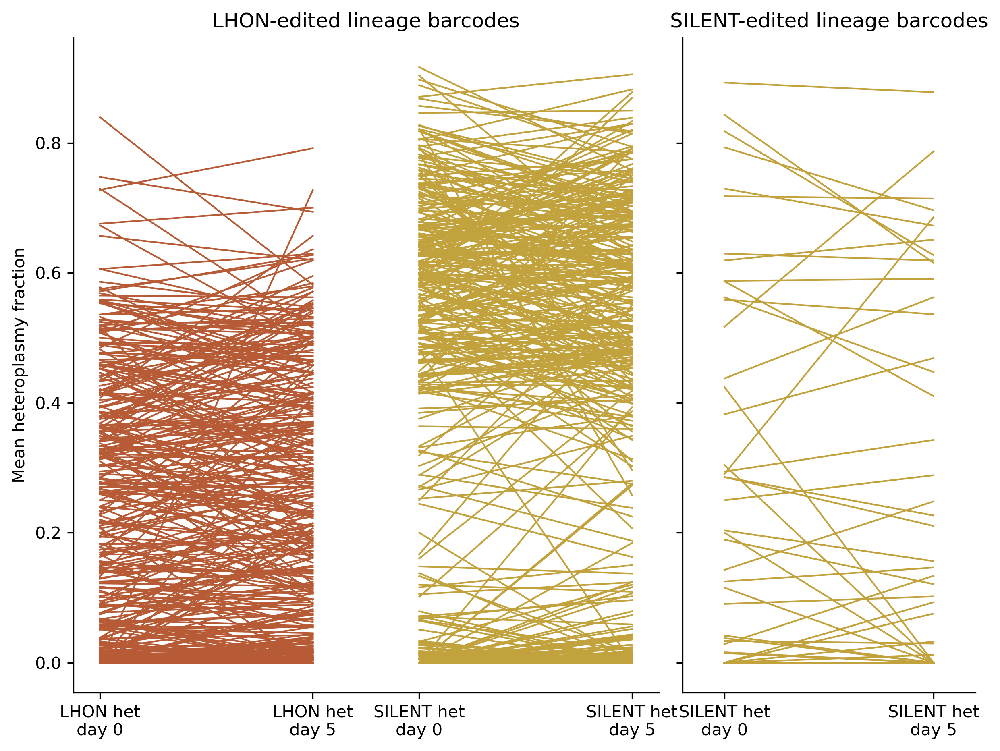

In [38]:
color_palette = [(183/255,91/255,54/255,1), (193/255,162/255,61/255,1)]

fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(8,6), dpi=300,
                            sharey=True, gridspec_kw={'width_ratios':[2,1]})

for k in lineage_bc_df.index.values:
    bc_data = lineage_bc_df.loc[k]
    if bc_data['from_bc1'].startswith('lhon'):
        axes[0].plot([0,1], bc_data[['from_lhon_het', 'to_lhon_het']].values, color=color_palette[0], linewidth=1)
        axes[0].plot([1.5,2.5], bc_data[['from_silent_het', 'to_silent_het']].values, color=color_palette[1], linewidth=1)
    else:
        axes[1].plot([0,1], bc_data[['from_silent_het', 'to_silent_het']].values, color=color_palette[1], linewidth=1)

axes[0].set_xticks([0,1,1.5,2.5])
axes[0].set_xticklabels(['LHON het\nday 0', 'LHON het\nday 5',
                         'SILENT het\nday 0', 'SILENT het\nday 5'])
axes[0].set_ylabel('Mean heteroplasmy fraction')
axes[0].set_title('LHON-edited lineage barcodes')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

axes[1].set_xlim((-0.2, 1.2))
axes[1].set_xticks([0,1])
axes[1].set_xticklabels(['SILENT het\nday 0', 'SILENT het\nday 5'])
#axes[1].set_ylabel('Heteroplasmy fraction')
axes[1].set_title('SILENT-edited lineage barcodes')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

fig.savefig('./lineage_tracing_line_plot.shorter.pdf', bbox_inches='tight')
fig.tight_layout()

(200, 10)


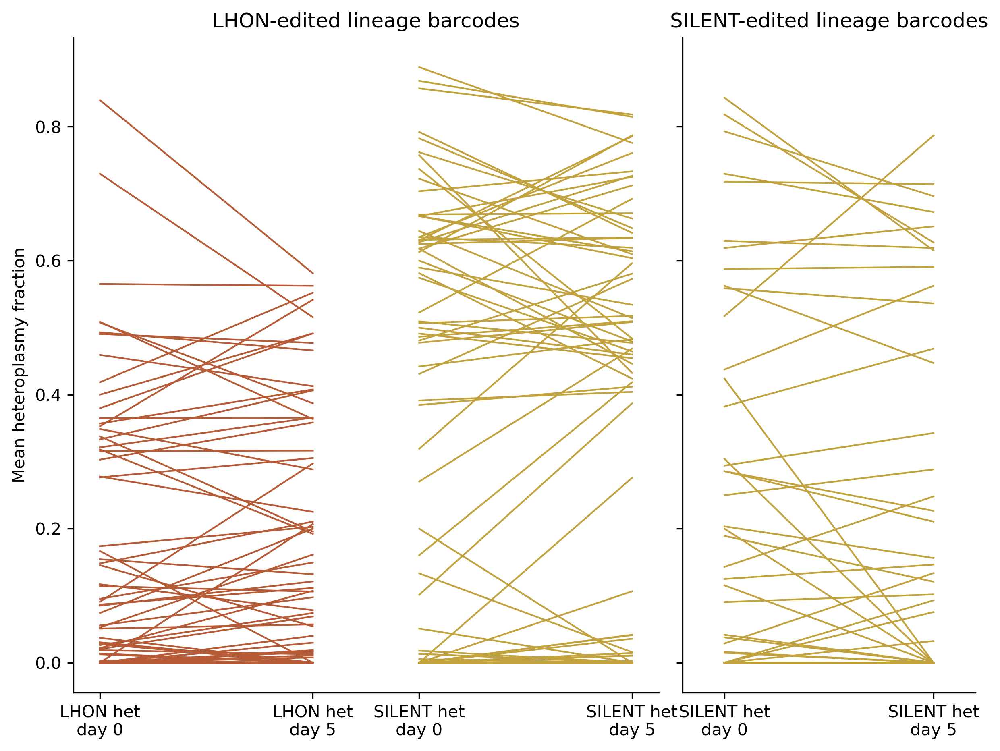

In [39]:
color_palette = [(183/255,91/255,54/255,1), (193/255,162/255,61/255,1)]

fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(8,6), dpi=300,
                            sharey=True, gridspec_kw={'width_ratios':[2,1]})

to_plot_subset = pandas.concat([lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('lhon')]
                                .sample(n=100, replace=False, random_state=2, axis=0),
                                lineage_bc_df[~lineage_bc_df['from_bc1'].str.startswith('lhon')]
                                .sample(n=100, replace=False, random_state=2, axis=0)])
print(to_plot_subset.shape)
for k in to_plot_subset.index.values:
    bc_data = lineage_bc_df.loc[k]
    if bc_data['from_bc1'].startswith('lhon'):
        axes[0].plot([0,1], bc_data[['from_lhon_het', 'to_lhon_het']].values, color=color_palette[0], linewidth=1)
        axes[0].plot([1.5,2.5], bc_data[['from_silent_het', 'to_silent_het']].values, color=color_palette[1], linewidth=1)
    else:
        axes[1].plot([0,1], bc_data[['from_silent_het', 'to_silent_het']].values, color=color_palette[1], linewidth=1)

axes[0].set_xticks([0,1,1.5,2.5])
axes[0].set_xticklabels(['LHON het\nday 0', 'LHON het\nday 5',
                         'SILENT het\nday 0', 'SILENT het\nday 5'])
axes[0].set_ylabel('Mean heteroplasmy fraction')
axes[0].set_title('LHON-edited lineage barcodes')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

axes[1].set_xlim((-0.2, 1.2))
axes[1].set_xticks([0,1])
axes[1].set_xticklabels(['SILENT het\nday 0', 'SILENT het\nday 5'])
#axes[1].set_ylabel('Heteroplasmy fraction')
axes[1].set_title('SILENT-edited lineage barcodes')
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

fig.savefig('./lineage_tracing_line_plot.shorter_subsampled.pdf', bbox_inches='tight')
fig.tight_layout()

In [27]:
print(lineage_bc_df.shape)
print(lineage_bc_df.groupby(['from_bc1', 'to_bc1']).size())
lineage_bc_df.groupby(['from_bc1', 'to_bc1']).mean()

(720, 8)
from_bc1   to_bc1   
lhon_d0    lhon_d5      591
silent_d0  silent_d5    129
dtype: int64


,,from_mt_umi_cov,to_mt_umi_cov,from_lhon_het,to_lhon_het,from_silent_het,to_silent_het
from_bc1,to_bc1,,,,,,
lhon_d0,lhon_d5,49.398618,66.665116,0.136300,0.141717,0.271111,0.268657
silent_d0,silent_d5,44.113695,64.527132,0.000215,0.000067,0.101159,0.094426


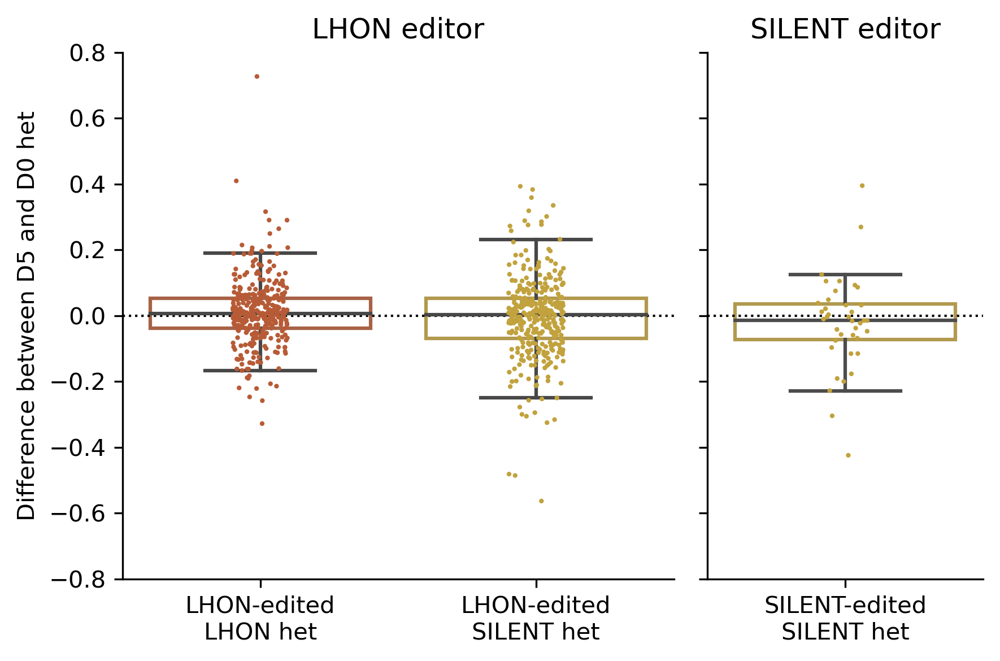

In [31]:
lineage_bc_df['lhon_het_diff'] = lineage_bc_df['to_lhon_het'] - lineage_bc_df['from_lhon_het']
lineage_bc_df['silent_het_diff'] = lineage_bc_df['to_silent_het'] - lineage_bc_df['from_silent_het']

lhon_edited_cells = lineage_bc_df.loc[lineage_bc_df['from_bc1'].str.startswith('lhon')]
silent_edited_cells = lineage_bc_df.loc[lineage_bc_df['from_bc1'].str.startswith('silent')]
yvals1 = [lhon_edited_cells.loc[(lhon_edited_cells['from_lhon_het'] > 0)
                                | (lhon_edited_cells['to_lhon_het'] > 0), 'lhon_het_diff'].values, 
          lhon_edited_cells.loc[(lhon_edited_cells['from_silent_het'] > 0)
                                | (lhon_edited_cells['to_silent_het'] > 0), 'silent_het_diff'].values,
         silent_edited_cells.loc[(silent_edited_cells['from_lhon_het'] > 0)
                                 | (silent_edited_cells['to_lhon_het'] > 0), 'lhon_het_diff'].values,
#          numpy.array([0]),
          silent_edited_cells.loc[(silent_edited_cells['from_silent_het'] > 0)
                                  | (silent_edited_cells['to_silent_het'] > 0), 'silent_het_diff'].values]
xvals = (([0]*yvals1[0].shape[0]) + ([1]*yvals1[1].shape[0]) 
         + ([2]*yvals1[2].shape[0]) + ([3]*yvals1[3].shape[0]))
yvals = numpy.hstack(yvals1)

fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(6,4), dpi=300,
                            sharey=True, gridspec_kw={'width_ratios':[2,1]})

yvals = numpy.hstack([lhon_edited_cells.loc[(lhon_edited_cells['from_lhon_het'] > 0)
                                            | (lhon_edited_cells['to_lhon_het'] > 0), 'lhon_het_diff'].values, 
                      lhon_edited_cells.loc[(lhon_edited_cells['from_silent_het'] > 0)
                                            | (lhon_edited_cells['to_silent_het'] > 0), 'silent_het_diff'].values])
xvals = (([0]*yvals1[0].shape[0]) + ([1]*yvals1[1].shape[0]))

ymax = numpy.max(numpy.absolute(yvals))
axes[0].set_ylim(((0-ymax)-(0.1*ymax), ymax+(0.1*ymax)))
axes[0].set_ylabel('Difference between D5 and D0 het')

plot_palette=[(183/255,91/255,54/255,1), (193/255,162/255,61/255,1)]
seaborn.boxplot(x=xvals, y=yvals, ax=axes[0], showfliers=False,
                palette=plot_palette)
seaborn.stripplot(x=xvals, y=yvals, ax=axes[0], s=2,
                  palette=plot_palette)
axes[0].axhline(0, color='k', linestyle='dotted', linewidth=1)
axes[0].set_xticks([0,1])
axes[0].set_xticklabels(['LHON-edited\nLHON het', 'LHON-edited\nSILENT het'])
axes[0].set_title('LHON editor')

yvals = silent_edited_cells.loc[(silent_edited_cells['from_silent_het'] > 0)
                                | (silent_edited_cells['to_silent_het'] > 0), 'silent_het_diff'].values
xvals = ([0]*yvals.shape[0])
seaborn.boxplot(x=xvals, y=yvals, ax=axes[1], showfliers=False,
                palette=plot_palette[1:])
seaborn.stripplot(x=xvals, y=yvals, ax=axes[1], s=2,
                  palette=[(193/255,162/255,61/255,1)])
axes[1].axhline(0, color='k', linestyle='dotted', linewidth=1)
axes[1].set_xticks([0])
axes[1].set_xticklabels(['SILENT-edited\nSILENT het'])
axes[1].set_title('SILENT editor')

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

fig.tight_layout()

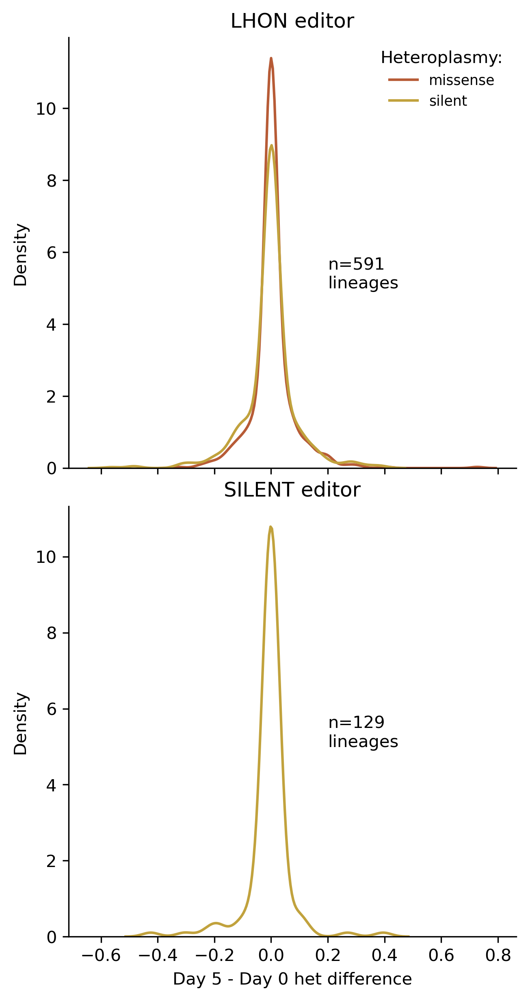

In [35]:
fig, axes = pyplot.subplots(nrows=2, ncols=1, figsize=(4.2,8), dpi=300, sharex=True)
plot_palette=[(183/255,91/255,54/255,1), (193/255,162/255,61/255,1)]
lhon_idx = lineage_bc_df['from_bc1'].str.startswith('lhon')
seaborn.kdeplot(data=lineage_bc_df[lhon_idx], x='lhon_het_diff',
                color=plot_palette[0], linestyle='solid', ax=axes[0], label='missense')
seaborn.kdeplot(data=lineage_bc_df[lhon_idx], x='silent_het_diff',
                color=plot_palette[1], linestyle='solid', ax=axes[0], label='silent')
axes[0].legend(loc='upper right', frameon=False, fontsize='small', title='Heteroplasmy:')
axes[0].set_title('LHON editor')
axes[0].annotate(f'n={numpy.sum(lhon_idx)}\nlineages', (0.2, 5))

silent_idx = lineage_bc_df['from_bc1'].str.startswith('silent')
seaborn.kdeplot(data=lineage_bc_df[silent_idx], x='silent_het_diff',
                color=plot_palette[1], linestyle='solid', ax=axes[1], label='SILENT-edited\nSILENT het')
axes[1].set_xlabel('Day 5 - Day 0 het difference')
axes[1].set_title('SILENT editor')
axes[1].annotate(f'n={numpy.sum(silent_idx)}\nlineages', (0.2, 5))

for ax in axes:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
fig.savefig('./lineage_tracing_het_diff_kde2.pdf', bbox_inches='tight')
fig.tight_layout()

In [85]:
lineage_bc_df['min_day_cov'] = lineage_bc_df[['from_mt_umi_cov', 'to_mt_umi_cov']].min(axis=1)
lineage_bc_df.head()

,from_bc1,to_bc1,from_mt_umi_cov,to_mt_umi_cov,from_lhon_het,to_lhon_het,from_silent_het,to_silent_het,lhon_het_diff,silent_het_diff,min_day_cov
0,lhon_d0,lhon_d5,29.5,136.0,0.000000,0.006579,0.000000,0.184211,0.006579,0.184211,29.5
1,silent_d0,silent_d5,80.0,43.5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,43.5
2,lhon_d0,lhon_d5,27.0,45.0,0.074074,0.200000,0.703704,0.733333,0.125926,0.029630,27.0
3,lhon_d0,lhon_d5,55.5,55.0,0.413934,0.545455,0.561475,0.400000,0.131520,-0.161475,55.0
4,lhon_d0,lhon_d5,40.0,33.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,33.0


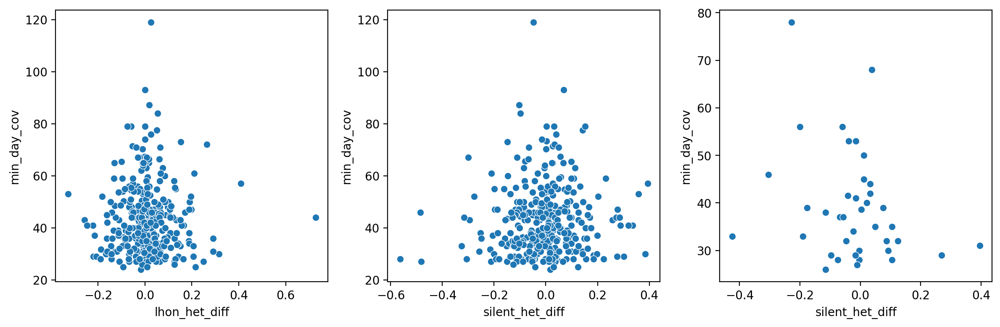

In [86]:
fig, axes = pyplot.subplots(nrows=1, ncols=3, figsize=(12,4))

seaborn.scatterplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('lhon')
                                       & numpy.any(lineage_bc_df[['from_lhon_het', 'to_lhon_het']] > 0, axis=1)],
                    x='lhon_het_diff', y='min_day_cov', ax=axes[0])
seaborn.scatterplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('lhon')
                                       & numpy.any(lineage_bc_df[['from_silent_het', 'to_silent_het']] > 0, axis=1)],
                    x='silent_het_diff', y='min_day_cov', ax=axes[1])
seaborn.scatterplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('silent')
                                       & numpy.any(lineage_bc_df[['from_silent_het', 'to_silent_het']] > 0, axis=1)],
                    x='silent_het_diff', y='min_day_cov', ax=axes[2])

fig.tight_layout()

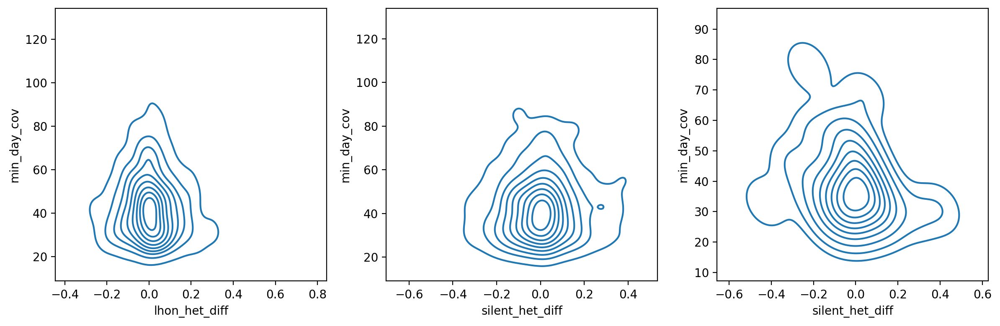

In [87]:
fig, axes = pyplot.subplots(nrows=1, ncols=3, figsize=(12,4))

seaborn.kdeplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('lhon')
                                   & numpy.any(lineage_bc_df[['from_lhon_het', 'to_lhon_het']] > 0, axis=1)],
                x='lhon_het_diff', y='min_day_cov', ax=axes[0])
seaborn.kdeplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('lhon')
                                   & numpy.any(lineage_bc_df[['from_silent_het', 'to_silent_het']] > 0, axis=1)],
                x='silent_het_diff', y='min_day_cov', ax=axes[1])
seaborn.kdeplot(data=lineage_bc_df[lineage_bc_df['from_bc1'].str.startswith('silent')
                                   & numpy.any(lineage_bc_df[['from_silent_het', 'to_silent_het']] > 0, axis=1)],
                x='silent_het_diff', y='min_day_cov', ax=axes[2])

fig.tight_layout()

### Save an uncompressed version of the csv file

In [88]:
valid_cells_filt.to_csv('./all_lineage_tracing.total_heteroplasmy_dataframe.csv', index=False, sep=',')